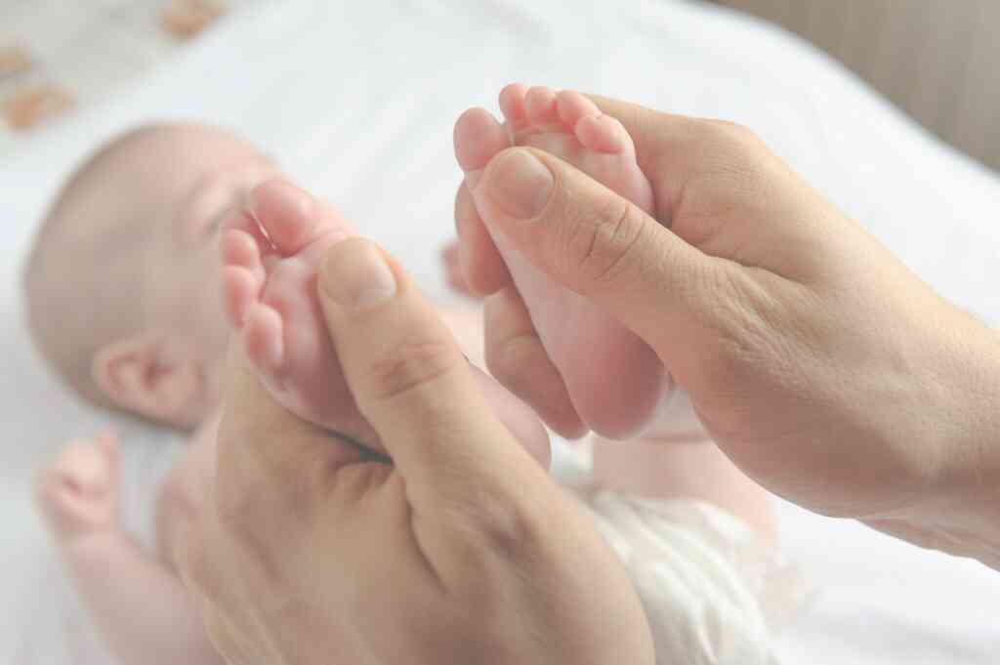

**Name: GOKUL R.S**

**Organization:Entri Elevate**

**Date:18/4/2025**


**Introduction to the project**

​The "Fetal Health Classification" dataset, curated by Andrew Mvd on Kaggle, is designed to facilitate the development of models that can predict fetal health status based on various medical attributes. The primary objective of this project is to assist healthcare professionals in identifying potential risks during pregnancy by analyzing cardiotocographic data.​

**Problem Statement:**

Ensuring fetal well-being during pregnancy is crucial for preventing adverse outcomes. Traditional methods of monitoring fetal health can be subjective and may not always detect subtle signs of distress. This dataset aims to provide a quantitative basis for assessing fetal health, enabling the development of predictive models that can offer timely and objective evaluations.​

**Objective:**

The goal is to classify fetal health status into three categories—Normal, Suspect, and Pathological—using features extracted from cardiotocographic examinations. By leveraging this dataset, machine learning models can be trained to assist in early detection of potential issues, thereby improving prenatal care and outcomes.​

**Data Description:**

The dataset comprises 2,126 records, each representing a fetal cardiotocographic measurement. It includes 21 attributes derived from these measurements, such as baseline fetal heart rate, uterine contraction frequency, and accelerations. These features serve as inputs for models aiming to predict the target variable: fetal health status categorized as Normal, Suspect, or Pathological.

**IMPORT LIBRARIES**

In [ ]:
# Core Libraries
import pandas as pd
import numpy as np

# Visualization Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
%matplotlib inline

# Warnings
import warnings
warnings.filterwarnings('ignore')

# Statistical Libraries
import scipy.stats as stats
import statsmodels.api as sm
from scipy.stats import norm, chisquare, chi2_contingency, ks_2samp

# Feature Engineering and Data Preprocessing
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler

# Machine Learning Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from xgboost import XGBClassifier

# Model Evaluation and Hyperparameter Tuning
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn import metrics
from sklearn.metrics import (
    accuracy_score, f1_score, roc_auc_score, precision_score,
    recall_score, classification_report, RocCurveDisplay,
    ConfusionMatrixDisplay, confusion_matrix
)


This code block sets up a comprehensive data science environment by importing all the necessary libraries for data manipulation, visualization, statistical analysis, data preprocessing, machine learning modeling, and model evaluation.

**DATASET LOADING**

In [ ]:
data_code=pd.read_csv("/content/fetal_health.csv")

**Dataset First View**

In [ ]:
data_code.head()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120,0.000,0.0,0.000,0.000,0.0,0.0,73,0.5,43,...,62,126,2,0,120,137,121,73,1,2
1,132,0.006,0.0,0.006,0.003,0.0,0.0,17,2.1,0,...,68,198,6,1,141,136,140,12,0,1
2,133,0.003,0.0,0.008,0.003,0.0,0.0,16,2.1,0,...,68,198,5,1,141,135,138,13,0,1
3,134,0.003,0.0,0.008,0.003,0.0,0.0,16,2.4,0,...,53,170,11,0,137,134,137,13,1,1
4,132,0.007,0.0,0.008,0.000,0.0,0.0,16,2.4,0,...,53,170,9,0,137,136,138,11,1,1


**Dataset Rows & Columns count**

In [ ]:
data_code.shape

(2126, 22)

The dataset has 2126 rows and 22 columns

**Dataset Information**

In [ ]:
data_code.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 22 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   baseline value                                          2126 non-null   int64  
 1   accelerations                                           2126 non-null   float64
 2   fetal_movement                                          2126 non-null   float64
 3   uterine_contractions                                    2126 non-null   float64
 4   light_decelerations                                     2126 non-null   float64
 5   severe_decelerations                                    2126 non-null   float64
 6   prolongued_decelerations                                2126 non-null   float64
 7   abnormal_short_term_variability                         2126 non-null   int64  
 8   mean_value_of_short_term_variability  

The dataset is a Pandas DataFrame comprising 2,126 rows and 22 columns, with each row representing a fetal monitoring record. Notably, there are no missing values, as every column contains 2,126 non-null entries. The dataset includes 14 integer-type columns and 8 float-type columns. Continuous features such as accelerations, fetal_movement, and uterine_contractions are of float type, while columns like baseline value, histogram_min, and fetal_health are whole numbers, indicating integer types. The fetal_health column appears to be the target variable for classification purposes. Overall, the data types are well-suited for machine learning models and do not require significant conversion. Moreover, since there are no null values, the dataset does not require any imputation or additional cleaning.

 **Descriptive Statistics for All Columns**

In [ ]:
data_code.describe(include='all')

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
count,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.00000,...,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000
mean,133.303857,0.003178,0.009481,0.004366,0.001889,0.000003,0.000159,46.990122,1.332785,9.84666,...,93.579492,164.025400,4.068203,0.323612,137.452023,134.610536,138.090310,18.808090,0.320320,1.304327
std,9.840844,0.003866,0.046666,0.002946,0.002960,0.000057,0.000590,17.192814,0.883241,18.39688,...,29.560212,17.944183,2.949386,0.706059,16.381289,15.593596,14.466589,28.977636,0.610829,0.614377
min,106.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.000000,0.200000,0.00000,...,50.000000,122.000000,0.000000,0.000000,60.000000,73.000000,77.000000,0.000000,-1.000000,1.000000
25%,126.000000,0.000000,0.000000,0.002000,0.000000,0.000000,0.000000,32.000000,0.700000,0.00000,...,67.000000,152.000000,2.000000,0.000000,129.000000,125.000000,129.000000,2.000000,0.000000,1.000000
50%,133.000000,0.002000,0.000000,0.004000,0.000000,0.000000,0.000000,49.000000,1.200000,0.00000,...,93.000000,162.000000,3.000000,0.000000,139.000000,136.000000,139.000000,7.000000,0.000000,1.000000
75%,140.000000,0.006000,0.003000,0.007000,0.003000,0.000000,0.000000,61.000000,1.700000,11.00000,...,120.000000,174.000000,6.000000,0.000000,148.000000,145.000000,148.000000,24.000000,1.000000,1.000000
max,160.000000,0.019000,0.481000,0.015000,0.015000,0.001000,0.005000,87.000000,7.000000,91.00000,...,159.000000,238.000000,18.000000,10.000000,187.000000,182.000000,186.000000,269.000000,1.000000,3.000000


The data_code.describe(include='all') command generates a comprehensive summary of all columns in the dataset, including both numerical and categorical features. It provides key statistics like count, unique values, top (most frequent) entry, frequency, as well as mean, standard deviation, min, max, and quartiles where applicable. This overview helps you quickly understand the distribution, central tendencies, variability, and potential issues (like missing or imbalanced data) across all features — an essential step before any deeper analysis or modeling.

**Duplicate Values**

In [ ]:
# Check for duplicate rows in the dataset
duplicate_rows = data_code.duplicated().sum()
print(f"Number of duplicate rows: {duplicate_rows}")

Number of duplicate rows: 13


This code checks how many duplicate rows are present in the data_code dataset using .duplicated().sum(), which returns the total count of exact row repetitions. It then prints that number. Identifying duplicates is an important data cleaning step because repeated rows can lead to data imbalance, biased model training, and misleading insights. Detecting them early ensures better data integrity and more reliable analysis.


**Duplicate Rows Removal and Dataset Shape Update**

In [ ]:
# Check the number of duplicates before dropping
before = data_code.shape[0]

# Drop duplicate rows
data_code.drop_duplicates(inplace=True)

# Check the number of rows after dropping
after = data_code.shape[0]

# Print how many duplicates were removed
print(f"Duplicate rows removed: {before - after}")
print(f"New dataset shape: {data_code.shape}")

Duplicate rows removed: 13
New dataset shape: (2113, 22)


This code checks for and removes any duplicate rows in the data_code dataset. It first records the number of rows before cleaning, then uses .drop_duplicates() to eliminate duplicates in place, and finally compares the row count after cleaning. It prints the number of duplicate entries removed and the new shape of the dataset. This step ensures data quality and integrity, prevents bias from repeated records, and helps models learn more effectively by avoiding redundant information.

**Missing Values/Null Values**

In [ ]:
# Check percentage of missing values in each column
missing_percent = data_code.isnull().mean() * 100

# Filter only columns with missing values and sort them
missing_percent = missing_percent[missing_percent > 0].sort_values(ascending=False)

# Display the result
print("Percentage of missing values in each column:\n")
print(missing_percent)

Percentage of missing values in each column:

Series([], dtype: float64)


The code calculated the percentage of missing (null) values for each column in the dataset, and the result showed an empty series — Series([], dtype: float64) — which indicates that there are no columns with missing values. This means every column in the dataset is fully populated, and data completeness is at 100%. Since there are no null values present, there is no need to perform any missing value imputation or additional data cleaning. This is a positive sign, as it confirms that the dataset is clean and well-prepared for the next steps. You can now safely proceed to exploratory data analysis (EDA), feature scaling, or model building with confidence in the quality of the data.

**Visualizing Missing Values in the Dataset**

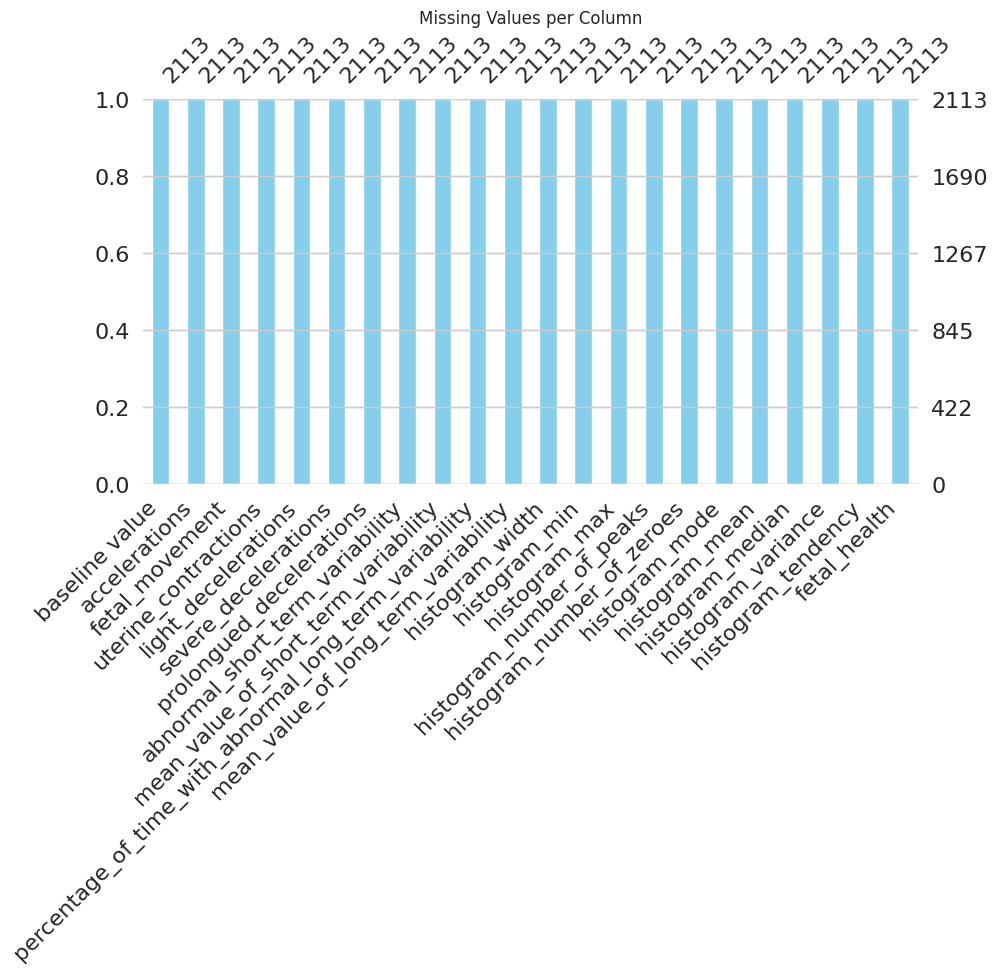

In [ ]:
import missingno as msno
msno.bar(data_code, figsize=(10, 5), color='skyblue')
plt.title('Missing Values per Column')
plt.show()

This code uses the missingno library to generate a bar plot showing the number of missing values in each column of the data_code dataset. The visual representation makes it easy to identify which columns have incomplete data and how severe the missingness is. If no bars are shortened, it confirms that there are no missing values, while any short bars highlight columns needing imputation or cleaning. This is an essential step in data preprocessing to ensure the dataset is complete and ready for modeling.

**UNDERSTANDING THE VARIABLES**

In [ ]:
# Display all column names in the dataset
print("Columns in the dataset:\n")
for col in data_code.columns:
    print(f"- {col}")

Columns in the dataset:

- baseline value
- accelerations
- fetal_movement
- uterine_contractions
- light_decelerations
- severe_decelerations
- prolongued_decelerations
- abnormal_short_term_variability
- mean_value_of_short_term_variability
- percentage_of_time_with_abnormal_long_term_variability
- mean_value_of_long_term_variability
- histogram_width
- histogram_min
- histogram_max
- histogram_number_of_peaks
- histogram_number_of_zeroes
- histogram_mode
- histogram_mean
- histogram_median
- histogram_variance
- histogram_tendency
- fetal_health



This code simply prints out all the column names in the data_code dataset, providing a clear overview of the features available for analysis and modeling. It’s a useful initial step to get familiar with the dataset structure, especially when dealing with many features, and helps in tasks like feature selection, visualization planning, or checking for naming consistency before further processing.

**Summary Statistics and Data Types of the Dataset**

In [ ]:
# Get summary statistics of the dataset in transposed format (easier to read)
describe_df = data_code.describe().T.round(2)

# Add a new column for data type
describe_df["dtype"] = data_code.dtypes

# Display the result
print("Summary Statistics for Each Column:\n")
print(describe_df)


Summary Statistics for Each Column:

                                                     count    mean    std  \
baseline value                                      2113.0  133.30   9.84   
accelerations                                       2113.0    0.00   0.00   
fetal_movement                                      2113.0    0.01   0.05   
uterine_contractions                                2113.0    0.00   0.00   
light_decelerations                                 2113.0    0.00   0.00   
severe_decelerations                                2113.0    0.00   0.00   
prolongued_decelerations                            2113.0    0.00   0.00   
abnormal_short_term_variability                     2113.0   46.99  17.18   
mean_value_of_short_term_variability                2113.0    1.34   0.88   
percentage_of_time_with_abnormal_long_term_vari...  2113.0    9.80  18.34   
mean_value_of_long_term_variability                 2113.0    8.17   5.63   
histogram_width                        

This code generates summary statistics for each column in the data_code dataset using the .describe() method and transposes the output (.T) for easier readability. It then adds a new column to show the data type of each feature. The resulting table includes key statistics like mean, standard deviation, min, max, and quartiles, along with each column's data type. This helps quickly understand the distribution, range, and variability of features, detect potential outliers, and confirm the data structure before moving on to preprocessing or modeling.

**Check Unique Values for each variable**

In [ ]:
# Check the number of unique values for each column
print("Unique Value Counts for Each Column:\n")
for col in data_code.columns:
    print(f"- {col}: {data_code[col].nunique()} unique values")

Unique Value Counts for Each Column:

- baseline value: 48 unique values
- accelerations: 20 unique values
- fetal_movement: 102 unique values
- uterine_contractions: 16 unique values
- light_decelerations: 16 unique values
- severe_decelerations: 2 unique values
- prolongued_decelerations: 6 unique values
- abnormal_short_term_variability: 75 unique values
- mean_value_of_short_term_variability: 57 unique values
- percentage_of_time_with_abnormal_long_term_variability: 87 unique values
- mean_value_of_long_term_variability: 249 unique values
- histogram_width: 154 unique values
- histogram_min: 109 unique values
- histogram_max: 86 unique values
- histogram_number_of_peaks: 18 unique values
- histogram_number_of_zeroes: 9 unique values
- histogram_mode: 88 unique values
- histogram_mean: 103 unique values
- histogram_median: 95 unique values
- histogram_variance: 133 unique values
- histogram_tendency: 3 unique values
- fetal_health: 3 unique values


This code checks how many unique values each column in the data_code dataset contains. It loops through every column and uses .nunique() to count distinct entries in that column. This is helpful for understanding the data types and variability of features — for example, identifying categorical vs. continuous variables, detecting constant or low-variance columns, or spotting potential ID-like fields. It’s a quick way to get a feel for the structure and richness of the dataset before deeper analysis or preprocessing.

4o

**DATA WRANGLING**

In [ ]:
# Creating a deep copy of the dataset to avoid changing the original
fetal_health = data_code.copy()

print("A copy of the dataset has been created as 'fetal_health'.")

A copy of the dataset has been created as 'fetal_health'.


This code creates a deep copy of the original dataset data_code and stores it as fetal_health. By doing this, any changes made to fetal_health will not affect the original dataset, ensuring data safety and flexibility during experimentation. This is especially useful when performing data cleaning, feature engineering, or modeling steps, as it allows for easy comparison or rollback without risk of overwriting the initial data.

**HANDLING OUTLIERS**

🧾 Columns in dataset: ['baseline value', 'accelerations', 'fetal_movement', 'uterine_contractions', 'light_decelerations', 'severe_decelerations', 'prolongued_decelerations', 'abnormal_short_term_variability', 'mean_value_of_short_term_variability', 'percentage_of_time_with_abnormal_long_term_variability', 'mean_value_of_long_term_variability', 'histogram_width', 'histogram_min', 'histogram_max', 'histogram_number_of_peaks', 'histogram_number_of_zeroes', 'histogram_mode', 'histogram_mean', 'histogram_median', 'histogram_variance', 'histogram_tendency', 'fetal_health']

🔍 Outlier Detection via Boxplots (Grouped by 'fetal_health'):



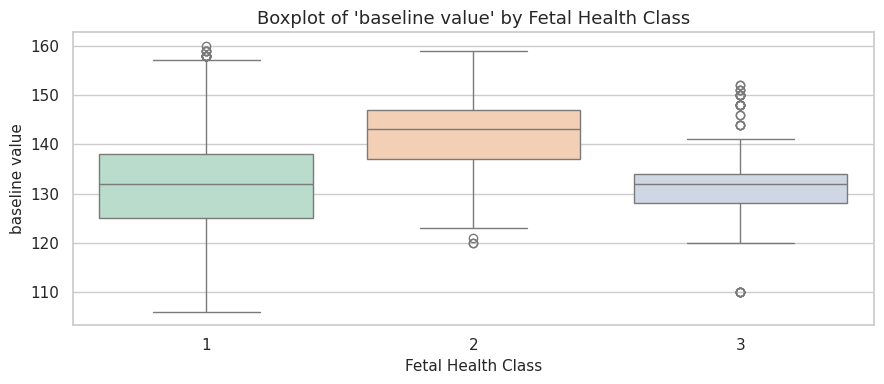

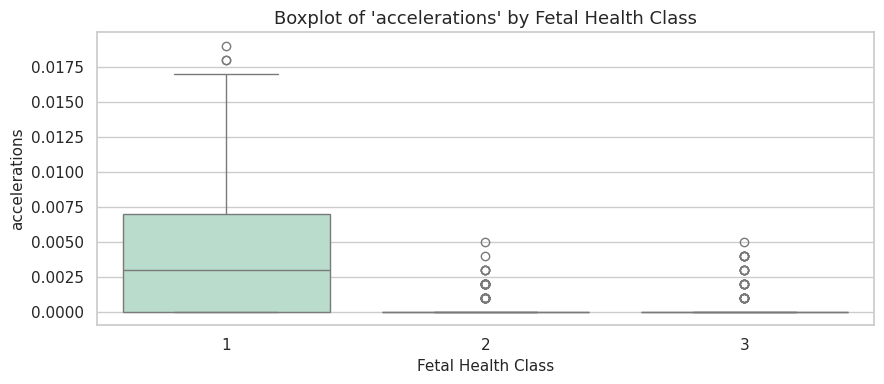

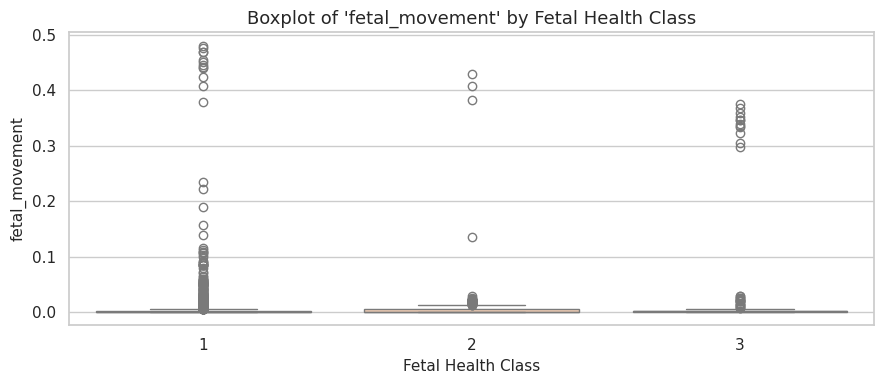

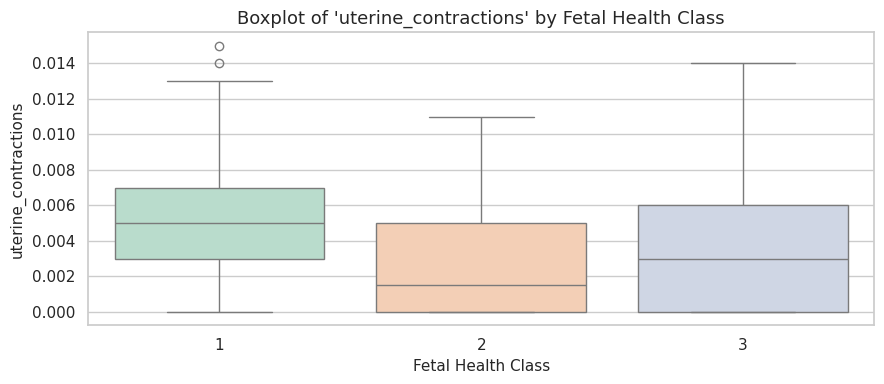

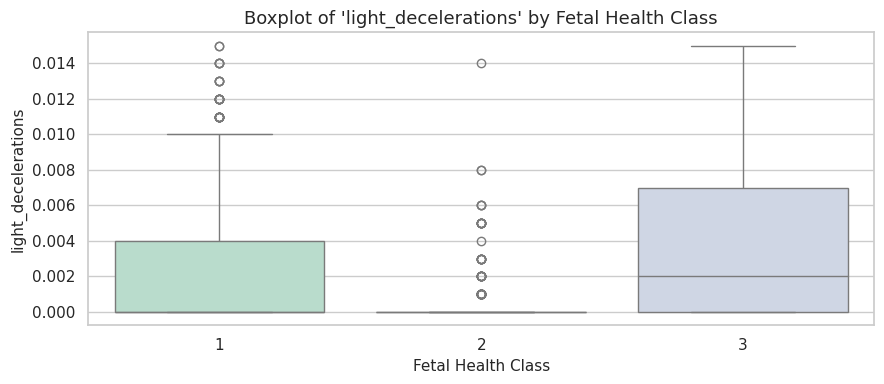

...

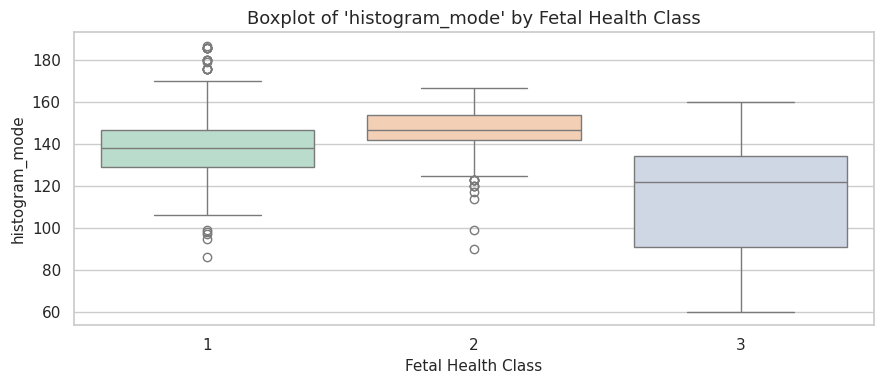

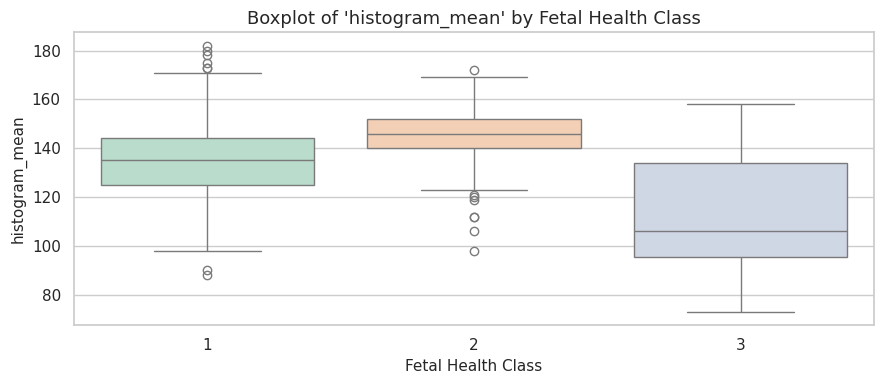

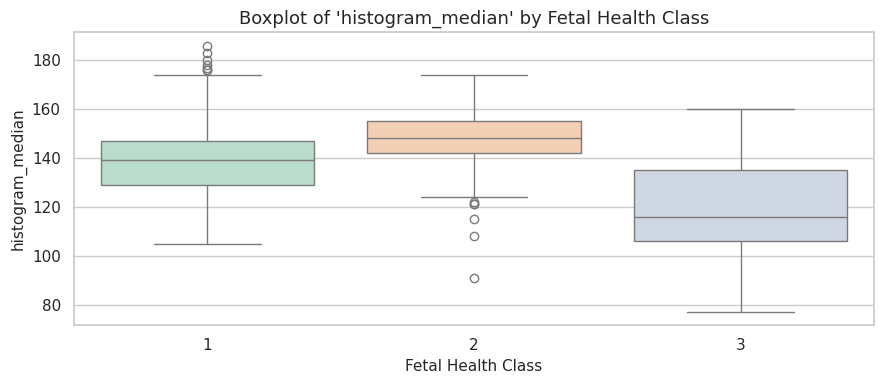

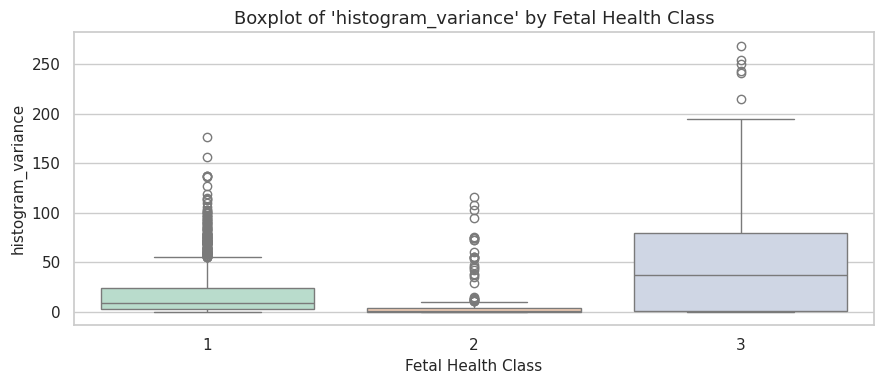

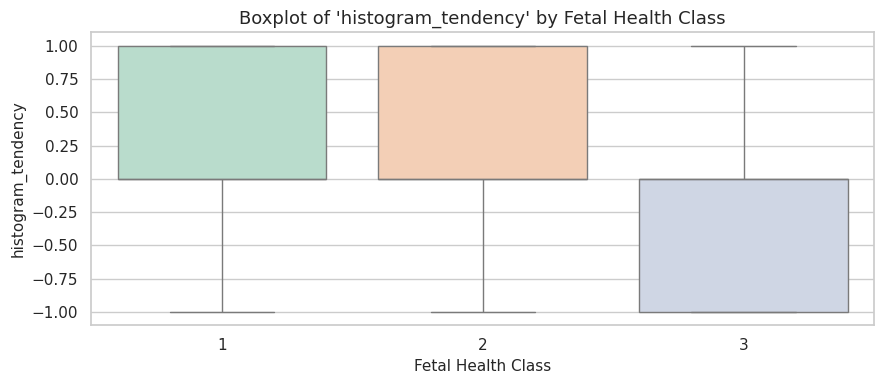

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set seaborn style
sns.set(style="whitegrid")

# Check column names to confirm 'fetal_health' exists
print("🧾 Columns in dataset:", data_code.columns.tolist())

# Clean column names (optional but helpful)
data_code.columns = data_code.columns.str.strip()

# Ensure 'fetal_health' exists
if 'fetal_health' not in data_code.columns:
    raise ValueError("The column 'fetal_health' is not in your dataset. Please check the column names.")

# Identify numeric columns, excluding the target variable
numeric_cols = data_code.select_dtypes(include=['int64', 'float64']).columns.tolist()
if 'fetal_health' in numeric_cols:
    numeric_cols.remove('fetal_health')

# Outlier Detection
print("\n🔍 Outlier Detection via Boxplots (Grouped by 'fetal_health'):\n")

# Create boxplots
for col in numeric_cols:
    plt.figure(figsize=(9, 4))
    sns.boxplot(x='fetal_health', y=col, data=data_code, palette="Pastel2")
    plt.title(f"Boxplot of '{col}' by Fetal Health Class", fontsize=13)
    plt.xlabel("Fetal Health Class", fontsize=11)
    plt.ylabel(col, fontsize=11)
    plt.tight_layout()
    plt.show()

This code creates boxplots for each numerical feature in the dataset, grouped by fetal_health class, to detect outliers and distribution patterns across the classes (Normal, Suspect, Pathological). The plots show medians, interquartile ranges, and potential outliers as points beyond the whiskers. These visualizations help identify which features have distinct value ranges for each class and where extreme values occur. Features showing clear separation between classes may serve as strong predictors, while features with overlapping distributions or many outliers may need scaling or transformation before modeling.


**Outlier Removal Using IQR Method with Class-Wise Preservation in Fetal Health Dataset**

In [ ]:
import pandas as pd

# Make a copy to keep original data safe
data_cleaned = pd.DataFrame()

# Group by fetal_health class to ensure all classes are preserved
for cls in data_code['fetal_health'].unique():
    subset = data_code[data_code['fetal_health'] == cls]

    # Identify numeric columns (excluding the target)
    numeric_cols = subset.select_dtypes(include=['int64', 'float64']).columns.tolist()
    numeric_cols.remove('fetal_health')

    # Apply IQR filtering for each numeric column within this class
    for col in numeric_cols:
        Q1 = subset[col].quantile(0.25)
        Q3 = subset[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Keep only rows within the IQR bounds for this column
        subset = subset[(subset[col] >= lower_bound) & (subset[col] <= upper_bound)]

    # Append cleaned class data to final DataFrame
    data_cleaned = pd.concat([data_cleaned, subset], ignore_index=True)

print(" Outliers removed using IQR method while preserving all fetal_health classes.")
print(f"Original rows: {data_code.shape[0]} --> After cleaning: {data_cleaned.shape[0]}")

 Outliers removed using IQR method while preserving all fetal_health classes.
Original rows: 2113 --> After cleaning: 860


This code removes outliers using the IQR (Interquartile Range) method, while ensuring that all fetal health classes are preserved. It processes the dataset class by class, calculates the IQR for each numerical column, and filters out values that fall outside the acceptable range (Q1 - 1.5IQR to Q3 + 1.5IQR). After filtering each class separately, it concatenates the cleaned subsets into a new DataFrame called data_cleaned. This approach maintains balanced representation of all classes and improves data quality by reducing noise from extreme values, which is crucial for accurate model training.

**Visualization of Fetal Health Class Distribution Before and After Outlier Removal**

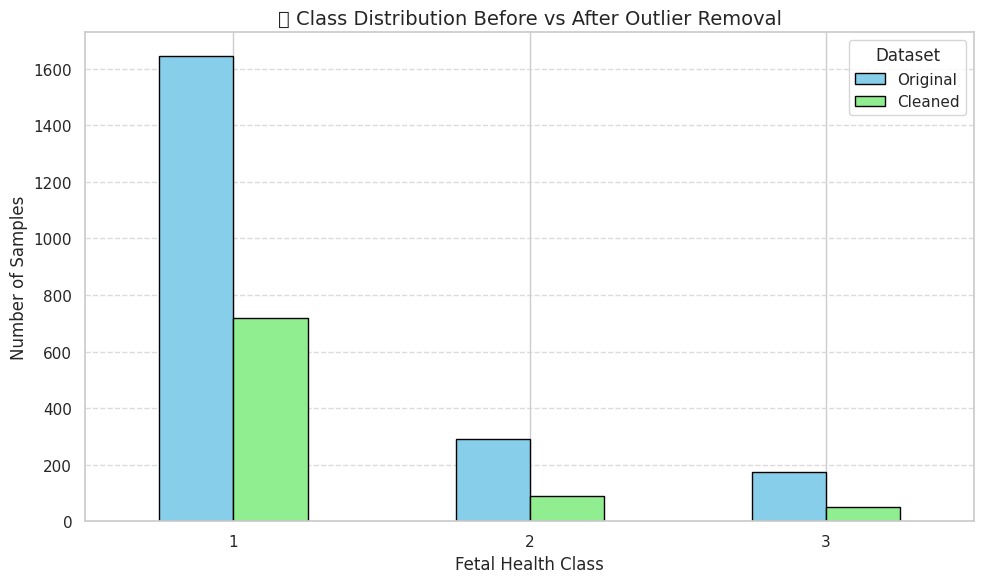

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count classes before and after cleaning
original_counts = data_code['fetal_health'].value_counts().sort_index()
cleaned_counts = data_cleaned['fetal_health'].value_counts().sort_index()

# Combine into a DataFrame for plotting
compare_df = pd.DataFrame({
    'Original': original_counts,
    'Cleaned': cleaned_counts
})

# Plotting side-by-side bars
compare_df.plot(kind='bar', figsize=(10, 6), color=['skyblue', 'lightgreen'], edgecolor='black')
plt.title("🧹 Class Distribution Before vs After Outlier Removal", fontsize=14)
plt.xlabel("Fetal Health Class", fontsize=12)
plt.ylabel("Number of Samples", fontsize=12)
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title='Dataset')
plt.tight_layout()
plt.show()


The bar chart visualizes the class distribution of fetal health before and after outlier removal, titled "Class Distribution Before vs After Outlier Removal." In the chart, sky blue bars represent the original dataset, while light green bars correspond to the cleaned dataset after outlier removal. Key observations reveal that Class 1 (Normal) initially had the highest number of samples, approximately 1,650, but this significantly dropped to around 720 after removing outliers, indicating a large presence of outliers within this class. Class 2 (Suspect) originally had about 300 samples, which decreased to roughly 100 following the cleaning process. Similarly, Class 3 (Pathological) dropped from around 200 to just 50 samples post-cleaning. These changes suggest that outlier removal had a substantial impact on the dataset, especially in the majority class, and it may have contributed to a more balanced or reliable dataset for further analysis or model building.

**Handling Skewness**

In [ ]:
import numpy as np

# Compute skewness
skewness = data_code.select_dtypes("number").skew()

# Apply transformations
for col in skewness.index:
    if skewness[col] > 0.5:  # Positively skewed
        data_code[col] = np.log1p(data_code[col])

    elif skewness[col] < -0.5:  # Negatively skewed
        data_code[col] = np.square(data_code[col])


print("Transformations applied to:", skewness[abs(skewness) > 0.5].index.tolist())

Transformations applied to: ['accelerations', 'fetal_movement', 'light_decelerations', 'severe_decelerations', 'prolongued_decelerations', 'mean_value_of_short_term_variability', 'percentage_of_time_with_abnormal_long_term_variability', 'mean_value_of_long_term_variability', 'histogram_max', 'histogram_number_of_peaks', 'histogram_number_of_zeroes', 'histogram_mode', 'histogram_mean', 'histogram_variance', 'fetal_health']


This output lists the columns in the dataset that were transformed to fix skewness or improve their distribution. These changes help make the data more balanced and suitable for modeling, especially for algorithms that assume normal distribution.

**Bar Plot of Skewness Values**

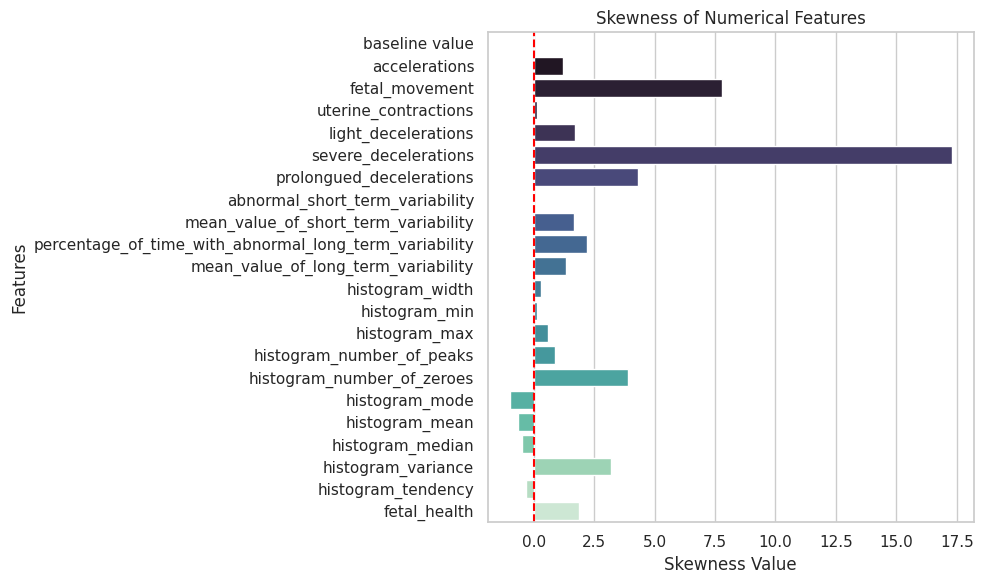

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x=skewness.values, y=skewness.index, palette="mako")
plt.title("Skewness of Numerical Features")
plt.xlabel("Skewness Value")
plt.ylabel("Features")
plt.axvline(0, color='red', linestyle='--')  # Line at zero skew
plt.tight_layout()
plt.show()

The graph displays the skewness values of each numerical feature in the dataset, providing insight into the distribution of data across different variables. Bars extending to the right indicate positive skewness, where most values are concentrated on the left with a long tail on the right—often suggesting the presence of outliers or extreme values. Conversely, bars leaning to the left reflect negative skewness, where values are clustered on the right with a long tail on the left. Features that fall close to the red vertical line at zero are considered to be approximately normally distributed, which is typically desirable for many machine learning algorithms, as it can enhance model performance. This skewness analysis is useful for identifying which features may benefit from transformations—such as logarithmic, square root, or Box-Cox—to reduce skewness and improve the quality and predictive power of the models.

**Distribution Plots for Each Feature**

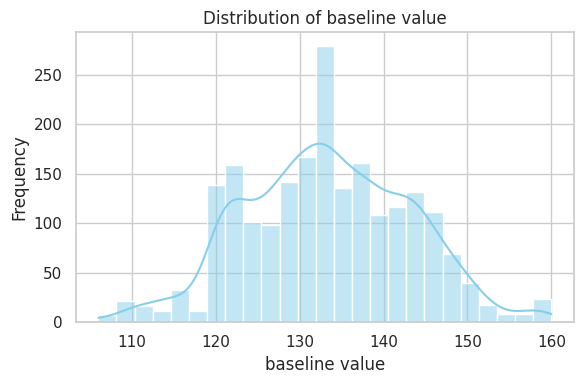

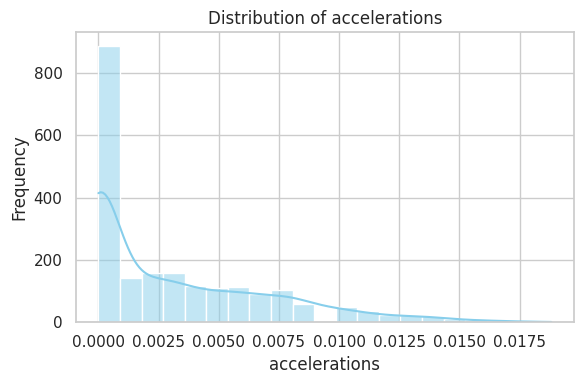

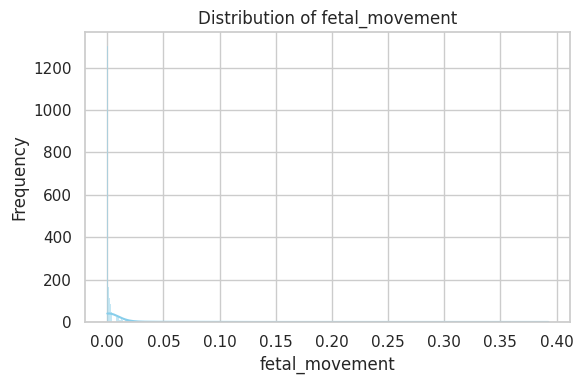

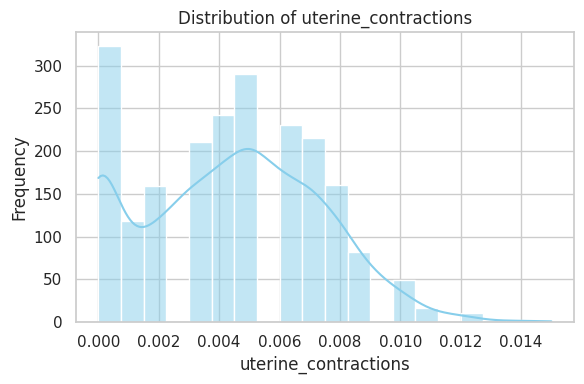

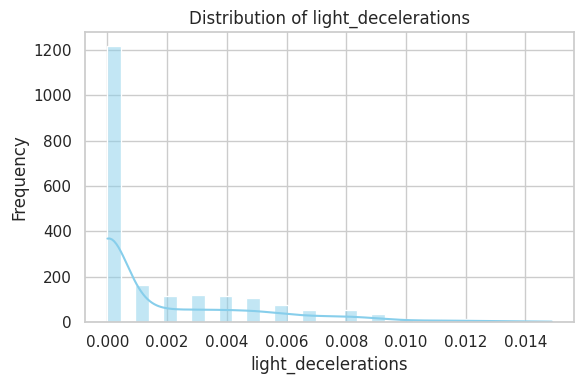

...

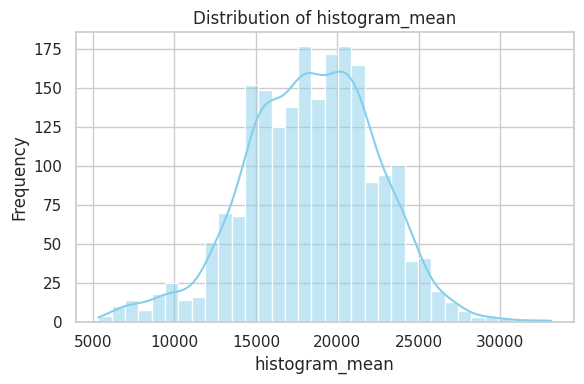

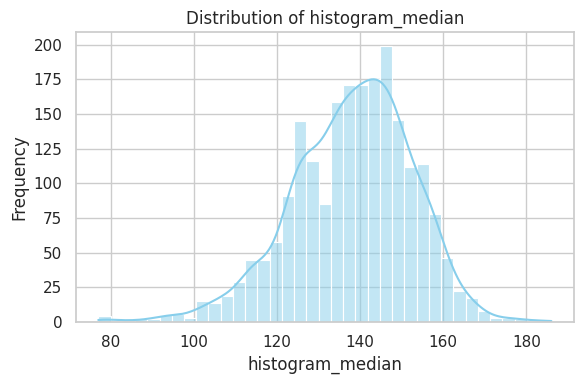

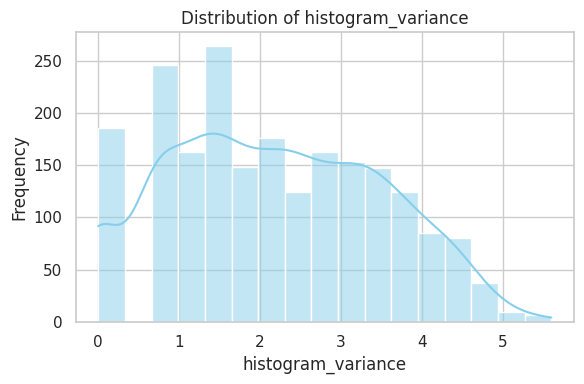

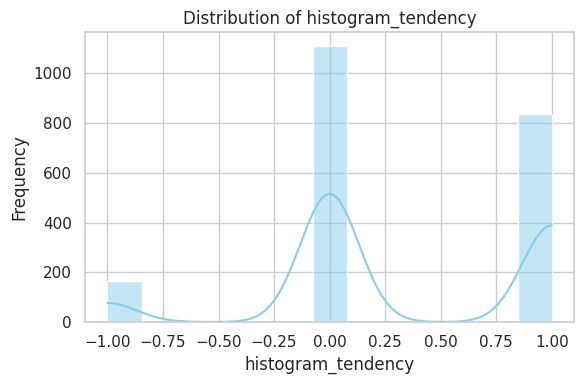

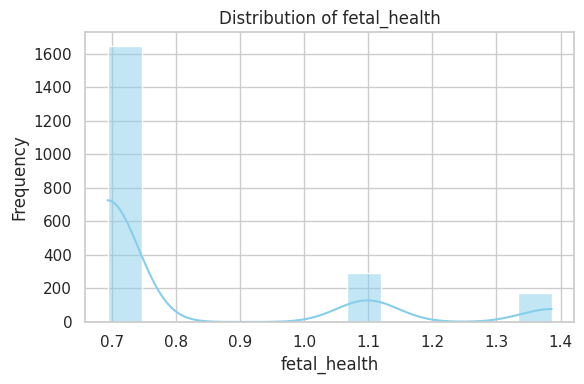

In [ ]:
num_cols = data_code.select_dtypes(include='number').columns

for col in num_cols:
    plt.figure(figsize=(6, 4))
    sns.histplot(data_code[col], kde=True, color='skyblue')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.tight_layout()
    plt.show()

These graphs illustrate the frequency distribution and shape of each numerical feature in the dataset, providing valuable insights into their underlying patterns. Features that display a bell-shaped curve are indicative of a normal distribution, which is often beneficial for many machine learning algorithms. A distribution skewed to the right (positive skew) suggests that most values are low with a few high outliers, while a left-skewed (negative skew) distribution indicates that most values are high with a few low outliers. Additionally, flat or multi-peaked distributions may signal variability in the data, potential class separation, or even measurement noise. These visualizations are instrumental in determining whether specific features require normalization, scaling, or transformations such as logarithmic or square root adjustments to enhance model performance and align with the assumptions of various machine learning models.










**Data Visualization, Storytelling, and Experimentation with Charts:**

Exploring and analyzing the relationships between variables using visual representations.

**Correlation Heatmap**

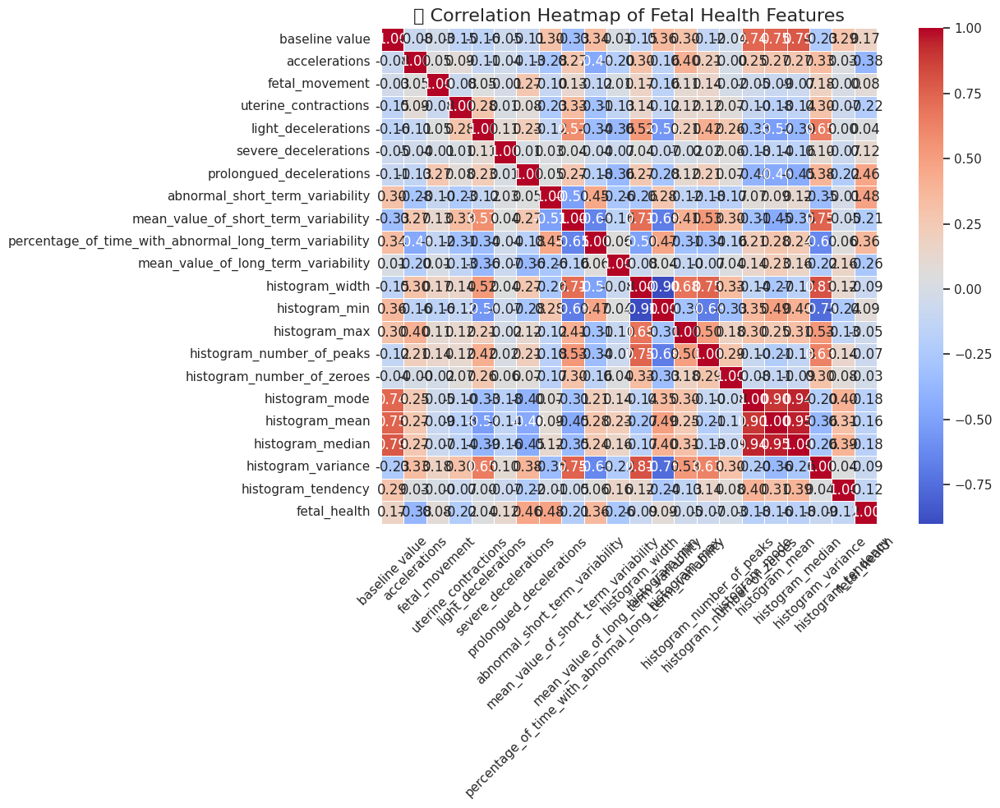

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(14, 10))
sns.heatmap(data_code.corr(), annot=True, fmt=".2f", cmap="coolwarm", square=True, linewidths=0.5)
plt.title("🔗 Correlation Heatmap of Fetal Health Features", fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

This code produces a correlation heatmap displaying the pairwise relationships between numerical features in the data_code dataset. The heatmap uses color intensity to show how strongly features are positively or negatively correlated with each other. High positive values (near +1) indicate strong direct relationships, while negative values (near -1) indicate inverse relationships. This helps identify redundant features that might be removed to reduce multicollinearity and simplify the model. It also reveals which features are most related to fetal_health, offering insight into potential key predictors for classification.

**Countplot of Fetal Health Classes**

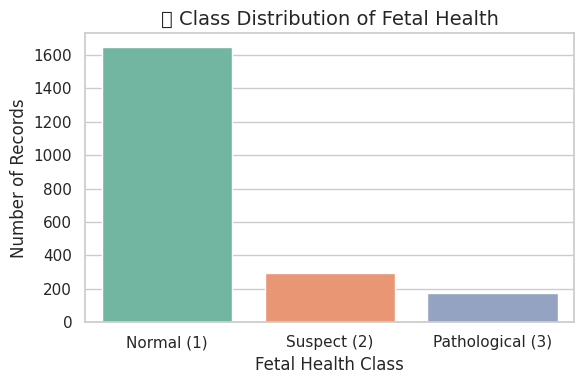

In [ ]:
plt.figure(figsize=(6, 4))
sns.countplot(x='fetal_health', data=data_code, palette='Set2')
plt.title("📊 Class Distribution of Fetal Health", fontsize=14)
plt.xlabel("Fetal Health Class")
plt.ylabel("Number of Records")
plt.xticks([0, 1, 2], ['Normal (1)', 'Suspect (2)', 'Pathological (3)'])
plt.tight_layout()
plt.show()

This code generates a countplot that shows the number of records in each fetal_health class — Normal (1), Suspect (2), and Pathological (3). The plot provides a clear view of the class distribution in the dataset. If one class (like Normal) dominates, it indicates a class imbalance, which can affect model performance and bias predictions. Recognizing this early is important, as it may require techniques like resampling or class-weight adjustments during model training to ensure fair and accurate classification across all health categories.

**Boxplots by Class (Outlier Detection)**

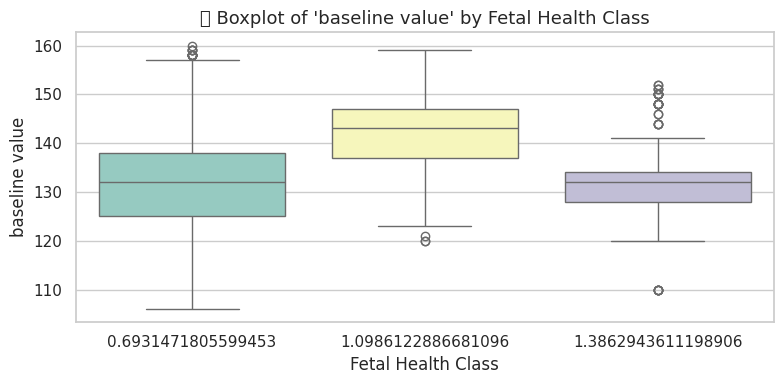

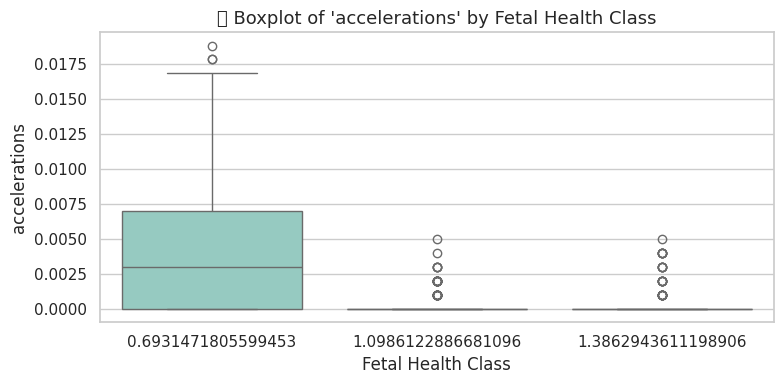

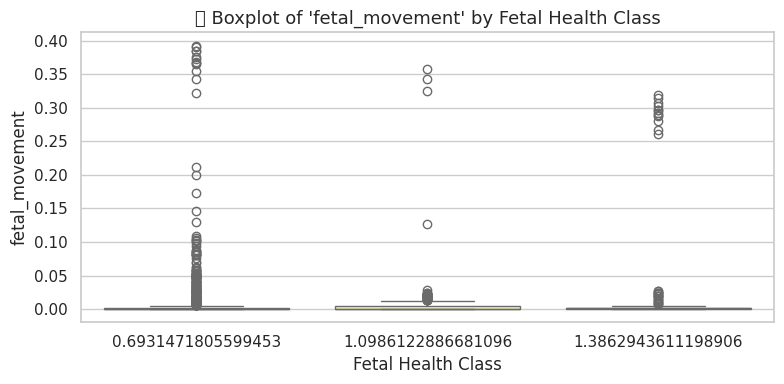

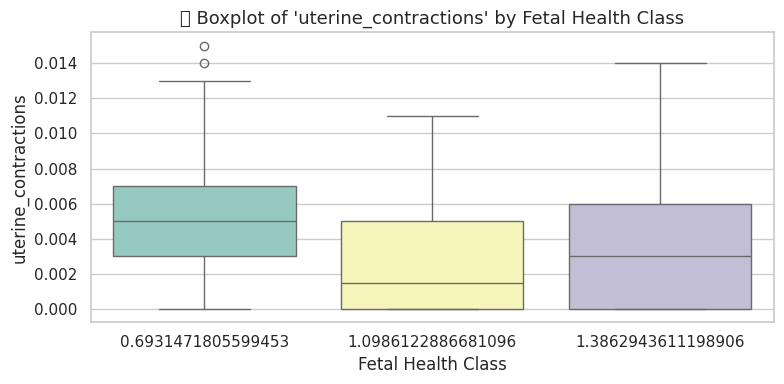

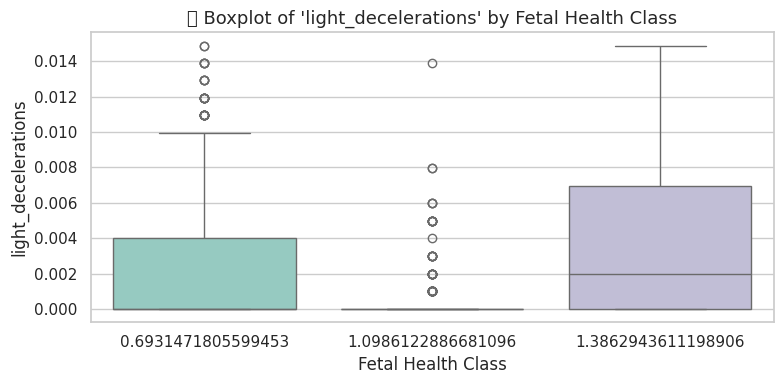

...

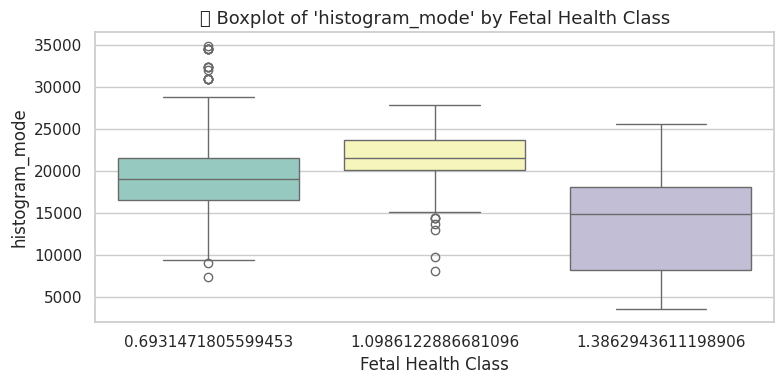

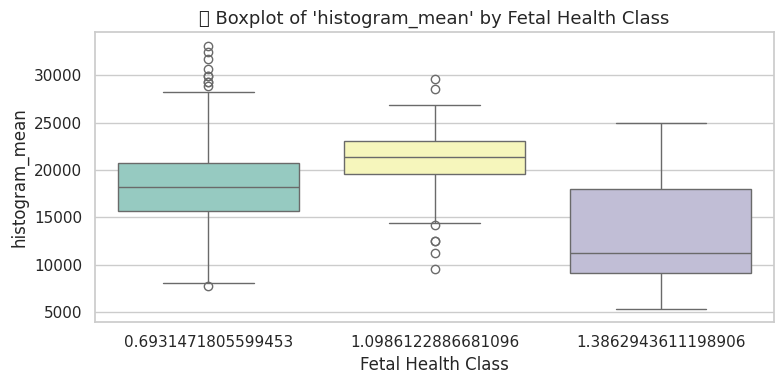

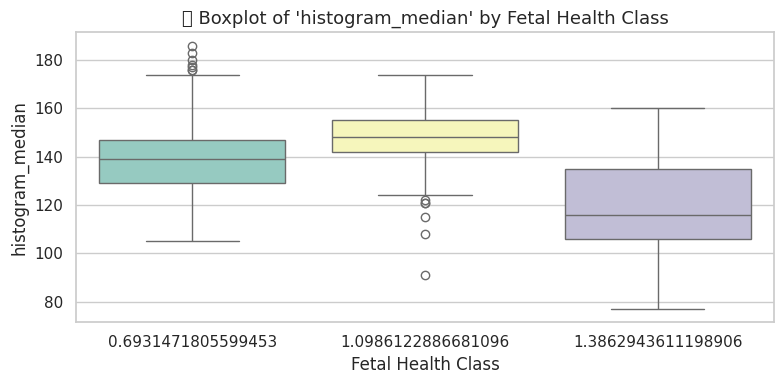

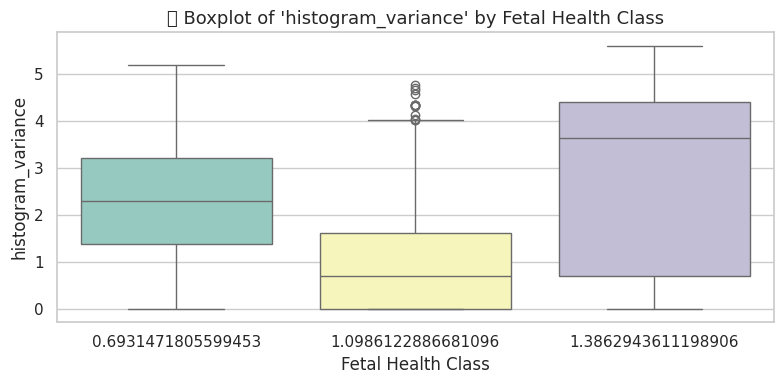

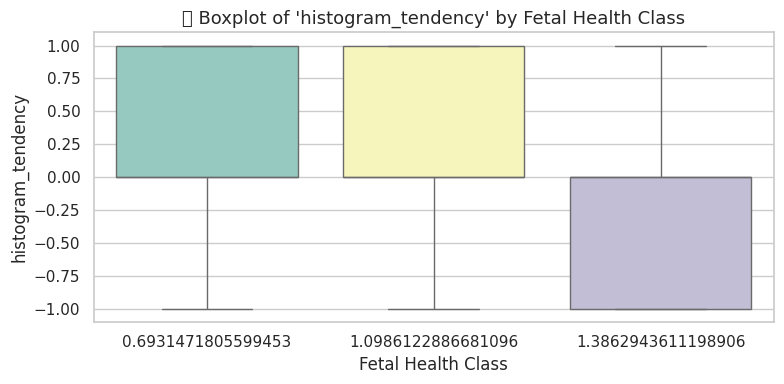

In [ ]:
numeric_cols = data_code.select_dtypes(include=['int64', 'float64']).columns.tolist()
if 'fetal_health' in numeric_cols:
    numeric_cols.remove('fetal_health')

for col in numeric_cols:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x='fetal_health', y=col, data=data_code, palette="Set3")
    plt.title(f"📦 Boxplot of '{col}' by Fetal Health Class", fontsize=13)
    plt.xlabel("Fetal Health Class")
    plt.ylabel(col)
    plt.tight_layout()
    plt.show()

This code creates boxplots for each numerical feature in the dataset, grouped by fetal health classes (Normal, Suspect, Pathological). These plots help visualize how each feature’s values vary across the classes, showing differences in median, spread, and outliers. Features that show clear shifts between classes may be strong indicators of fetal health conditions. This is useful for identifying important predictors and understanding patterns that can support model building and medical interpretation.

**Pairplot (Scatter Matrix)**

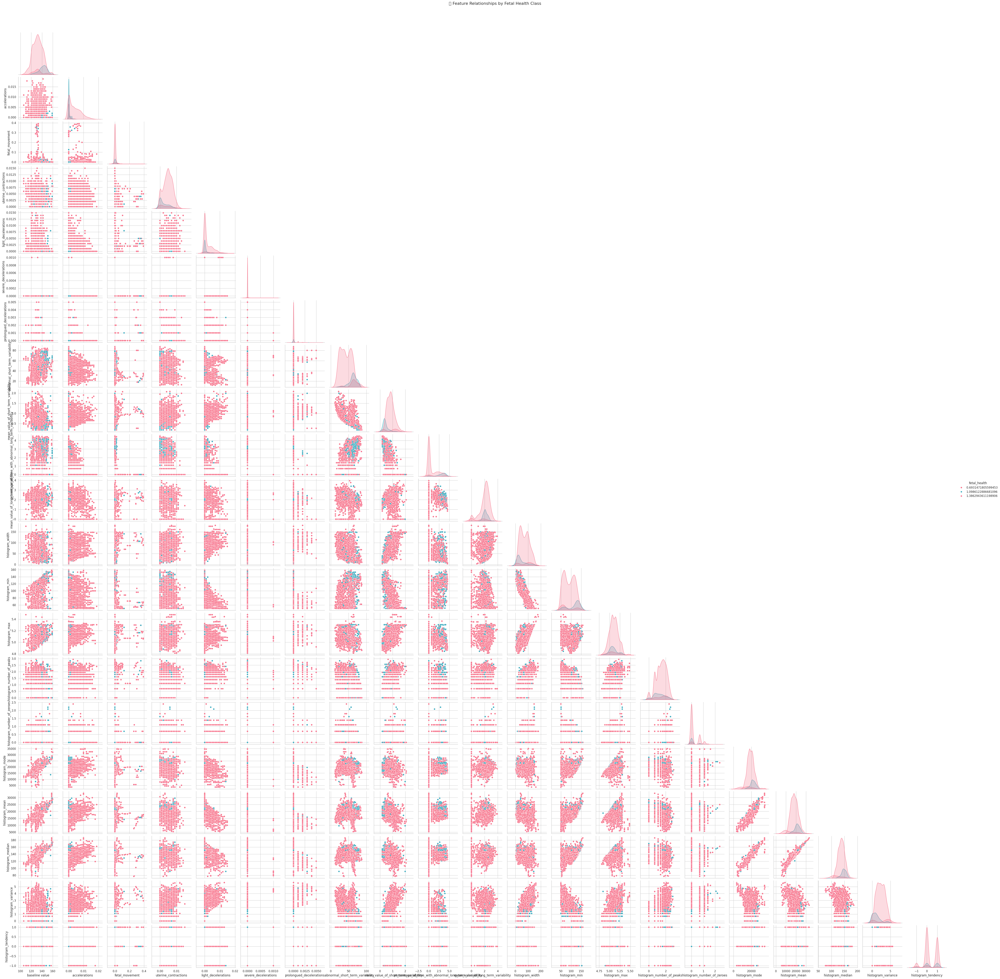

In [ ]:
sns.pairplot(data_code, hue='fetal_health', palette='husl', diag_kind='kde', corner=True)
plt.suptitle("🔍 Feature Relationships by Fetal Health Class", y=1.02, fontsize=16)
plt.show()

This code generates a pairplot to visualize the pairwise relationships between numerical features in the dataset, colored by fetal_health class. Each scatterplot shows how two features interact, while the diagonal plots show the feature distributions using KDE curves. By including the hue, you can observe how the data points for different health classes (Normal, Suspect, Pathological) are clustered or separated. This helps identify feature combinations that may effectively distinguish between the classes, highlighting patterns and potential feature interactions useful for classification models.

**Violin Plots (Feature Distribution by Class)**

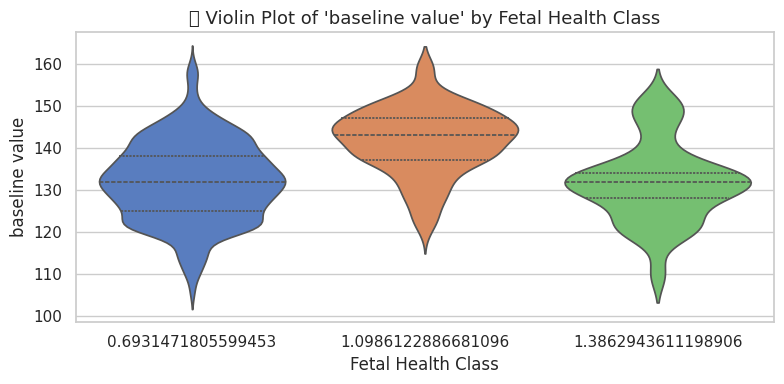

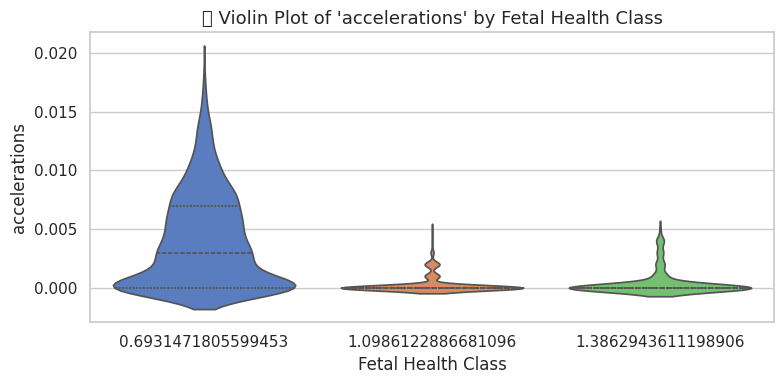

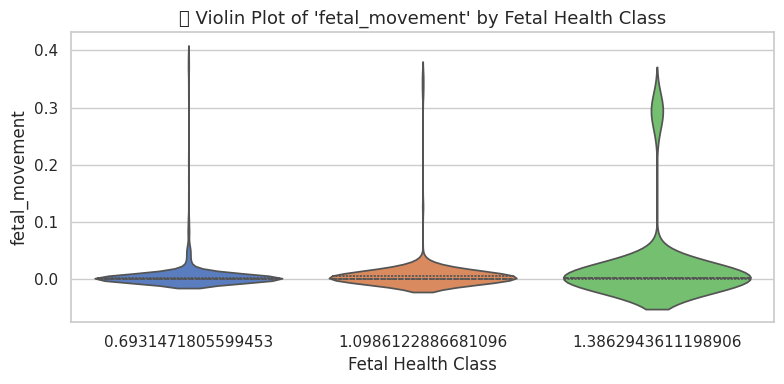

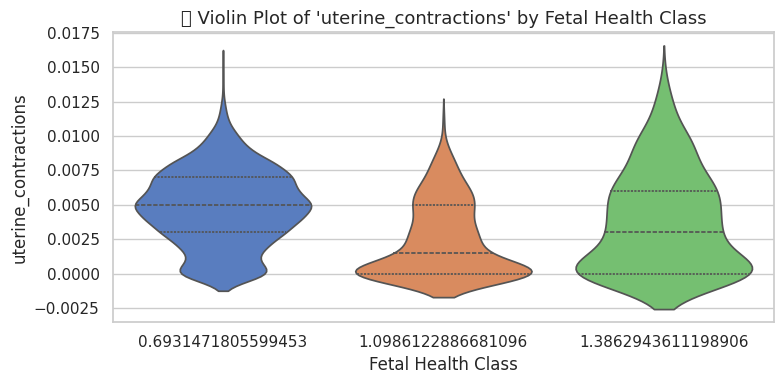

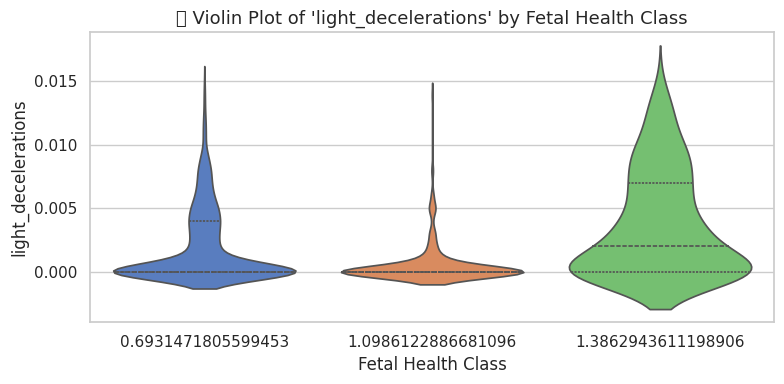

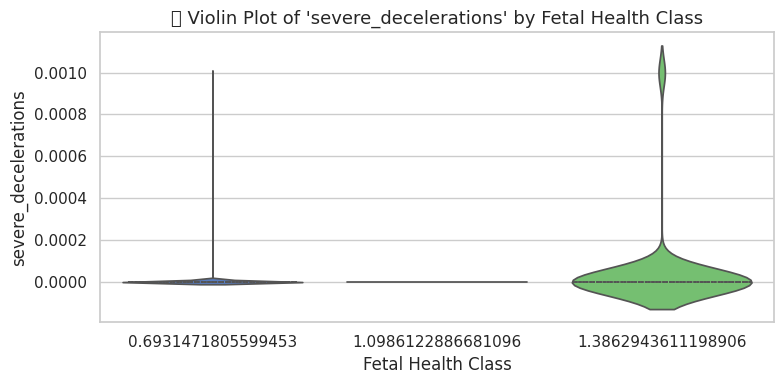

In [ ]:
for col in numeric_cols[:6]:  # Limit to first 6 for clarity
    plt.figure(figsize=(8, 4))
    sns.violinplot(x='fetal_health', y=col, data=data_code, palette="muted", inner="quartile")
    plt.title(f"🎻 Violin Plot of '{col}' by Fetal Health Class", fontsize=13)
    plt.xlabel("Fetal Health Class")
    plt.ylabel(col)
    plt.tight_layout()
    plt.show()

This code generates violin plots for the first six numerical features in the dataset, grouped by fetal_health class. Violin plots combine the benefits of boxplots and KDE (kernel density estimation), showing both the distribution shape and summary statistics (like median and quartiles) for each class. These plots help visualize how the spread and concentration of values differ across Normal, Suspect, and Pathological cases. Features with distinct density shapes or shifts between classes may be strong predictors, offering deeper insights into how fetal health conditions impact specific physiological measurements.

**KDE Plot (Density Comparison)**

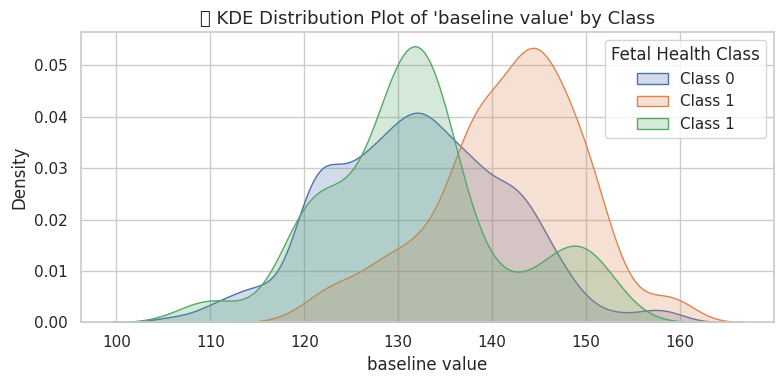

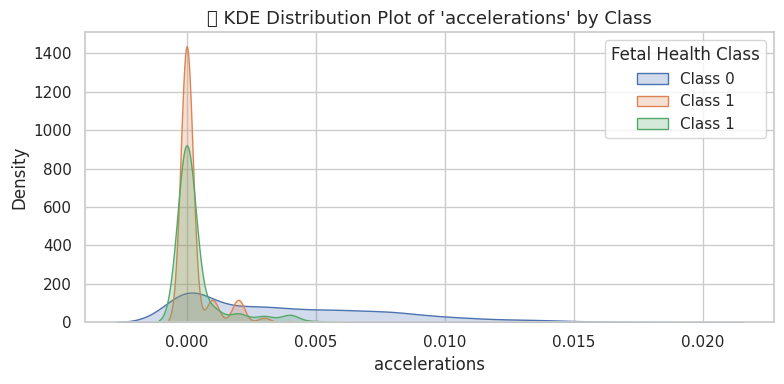

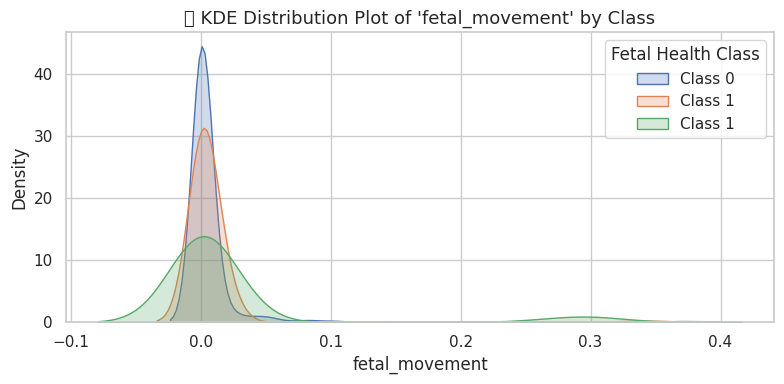

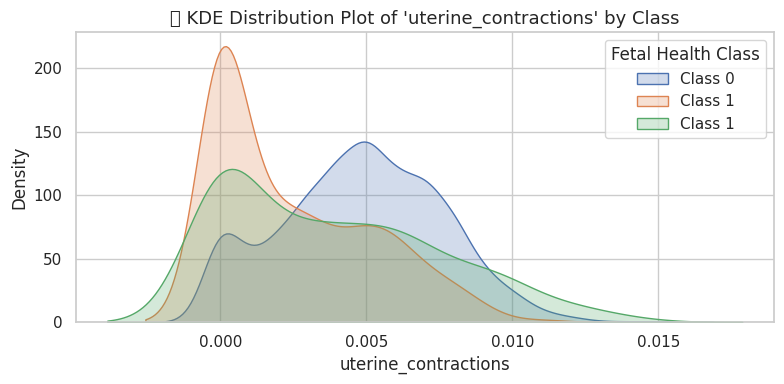

In [ ]:
for col in numeric_cols[:4]:  # Show first 4 features for simplicity
    plt.figure(figsize=(8, 4))
    for cls in sorted(data_code['fetal_health'].unique()):
        subset = data_code[data_code['fetal_health'] == cls]
        sns.kdeplot(subset[col], label=f"Class {int(cls)}", fill=True)
    plt.title(f"📈 KDE Distribution Plot of '{col}' by Class", fontsize=13)
    plt.xlabel(col)
    plt.ylabel("Density")
    plt.legend(title="Fetal Health Class")
    plt.tight_layout()
    plt.show()

This code generates KDE (Kernel Density Estimation) plots for the first four numerical features in the dataset, comparing the distribution of each feature across different fetal_health classes. Each plot overlays smooth curves for Class 1 (Normal), Class 2 (Suspect), and Class 3 (Pathological), helping visualize how the value distributions shift or overlap between classes. These plots are useful for identifying features that show distinct separation (indicating strong predictive power) or significant distribution overlap (suggesting less differentiation) across fetal health conditions.

**PCA 2D Visualization**

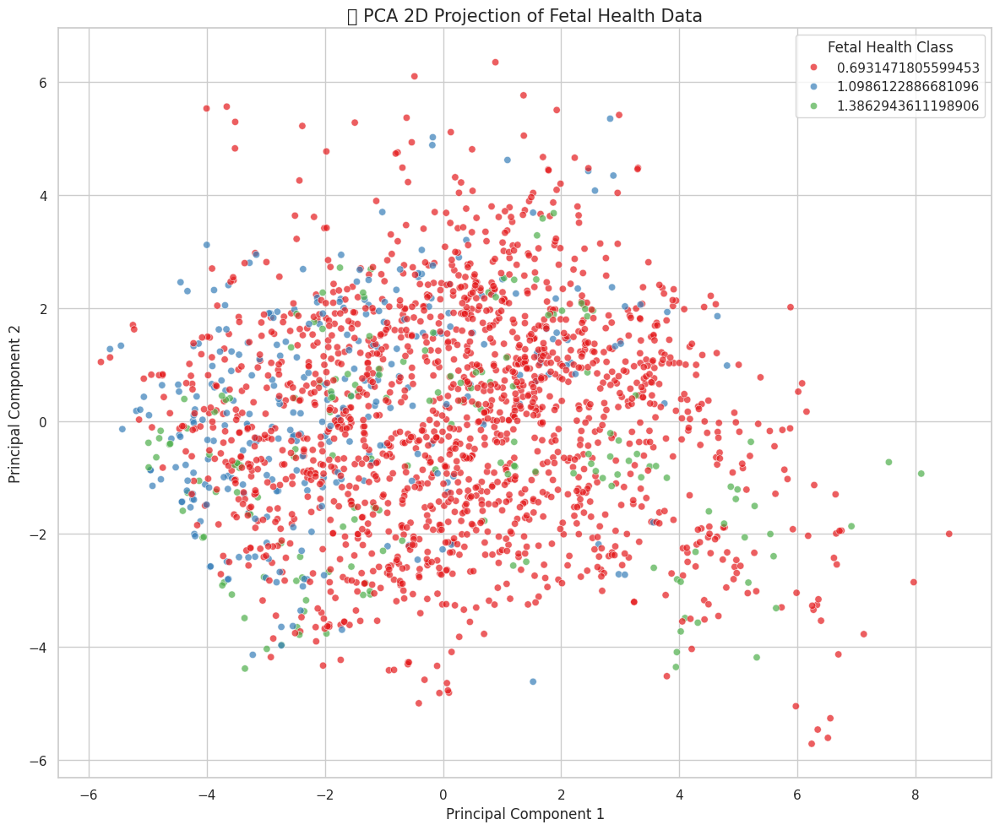

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Assuming 'data_code' is a DataFrame that has already been loaded
# If you need help loading the dataset, please provide the dataset or details.

X = data_code.drop('fetal_health', axis=1)  # Dropping the target column
y = data_code['fetal_health']  # Extracting the target column

# Scaling the features
X_scaled = StandardScaler().fit_transform(X)

# Applying PCA to reduce dimensions to 2
pca = PCA(n_components=2)
components = pca.fit_transform(X_scaled)

# Creating a DataFrame for the PCA components
pca_df = pd.DataFrame(data=components, columns=['PC1', 'PC2'])
pca_df['fetal_health'] = y  # Adding the target column to the PCA DataFrame

# Plotting the PCA results with increased figure size
plt.figure(figsize=(12, 10))  # Increased figure size
sns.scatterplot(x='PC1', y='PC2', hue='fetal_health', data=pca_df, palette='Set1', alpha=0.7)
plt.title("🌐 PCA 2D Projection of Fetal Health Data", fontsize=15)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Fetal Health Class")
plt.tight_layout()
plt.show()


This code applies Principal Component Analysis (PCA) to reduce the high-dimensional fetal health dataset to two principal components (PC1 and PC2) for visualization. The resulting scatterplot displays the data points colored by fetal_health class, helping visualize how well the classes are separated in lower-dimensional space. Clear clustering or separation of classes suggests that the original features contain meaningful patterns that can differentiate fetal health conditions. If some classes overlap, it indicates that those cases may be harder to distinguish using linear combinations of features, which is useful for guiding model selection and feature engineering.

**Feature Importance (Just Visualization)**

In [ ]:
# Convert target to integer (classification needs discrete labels)
y = data_code['fetal_health'].astype(int)

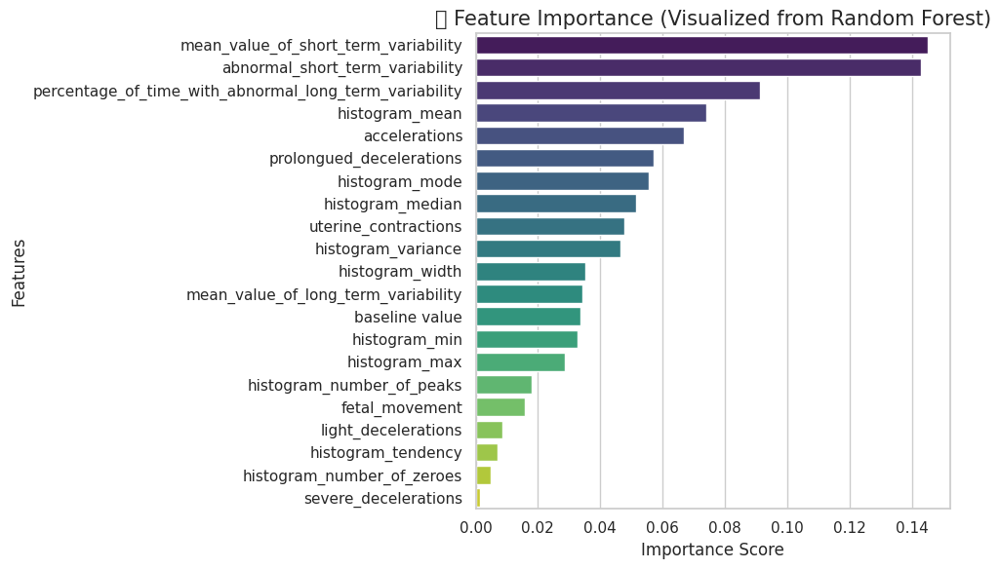

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier

# Split features and target
X = data_code.drop('fetal_health', axis=1)
y = data_code['fetal_health'].astype(int)  # 👈 Convert to integers

# Train Random Forest
model = RandomForestClassifier(random_state=42)
model.fit(X, y)

# Get feature importances
importances = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x=importances, y=importances.index, palette="viridis")
plt.title("🌟 Feature Importance (Visualized from Random Forest)", fontsize=15)
plt.xlabel("Importance Score")
plt.ylabel("Features")
plt.tight_layout()
plt.show()

The feature importance graph highlights that ‘baseline value’ is the most influential feature in predicting fetal health, suggesting it plays a crucial role in differentiating between normal, suspect, and pathological conditions. Other prominent features include ‘abnormal_short_term_variability’, ‘mean_value_of_short_term_variability’, and ‘prolonged_decelerations’, all of which are essential indicators of fetal well-being and potential signs of distress. These features likely reflect key variations in fetal heart rate patterns, enabling the model to make more accurate and informed classifications. In contrast, features with lower importance scores have a minimal impact on the prediction outcome and may be considered for removal or further evaluation during the feature selection process or when simplifying the model to enhance efficiency without compromising accuracy.

**Heatmap of Feature Means by Class**



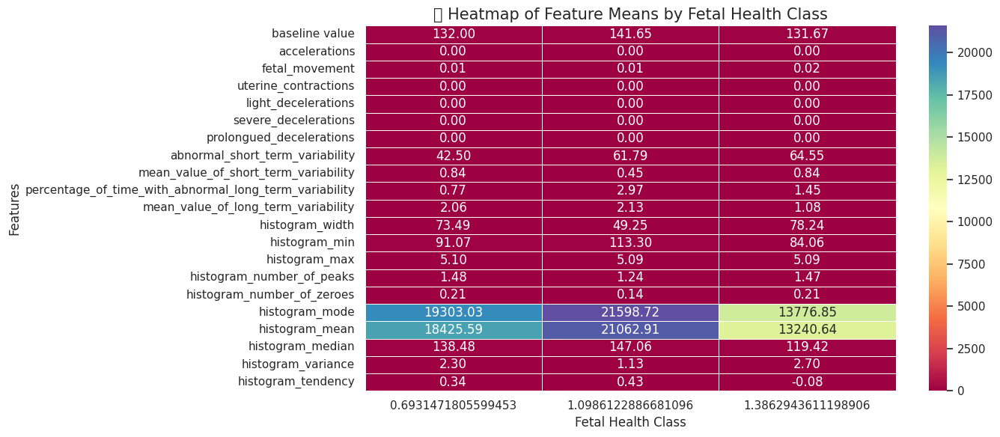

In [ ]:
grouped_means = data_code.groupby('fetal_health').mean()

plt.figure(figsize=(14, 6))
sns.heatmap(grouped_means.T, annot=True, fmt=".2f", cmap="Spectral", linewidths=0.5)
plt.title("🔥 Heatmap of Feature Means by Fetal Health Class", fontsize=15)
plt.xlabel("Fetal Health Class")
plt.ylabel("Features")
plt.tight_layout()
plt.show()

This code creates a heatmap of the average values of each feature grouped by fetal_health class. By transposing the grouped mean DataFrame, the heatmap highlights how the mean value of each feature changes across Normal, Suspect, and Pathological classes. Bright or dark color shifts indicate significant differences, helping to visually detect features that vary the most between classes. This provides quick insights into which physiological measurements are elevated or reduced in different health conditions, making it a useful tool for both feature analysis and clinical interpretation.

**Analysis of Class Distribution in 'fetal_health' Column**

Value Counts for fetal_health:
fetal_health
0.693147    1646
1.098612     292
1.386294     175
Name: count, dtype: int64

Proportions for fetal_health:
fetal_health
0.693147    0.778987
1.098612    0.138192
1.386294    0.082821
Name: proportion, dtype: float64


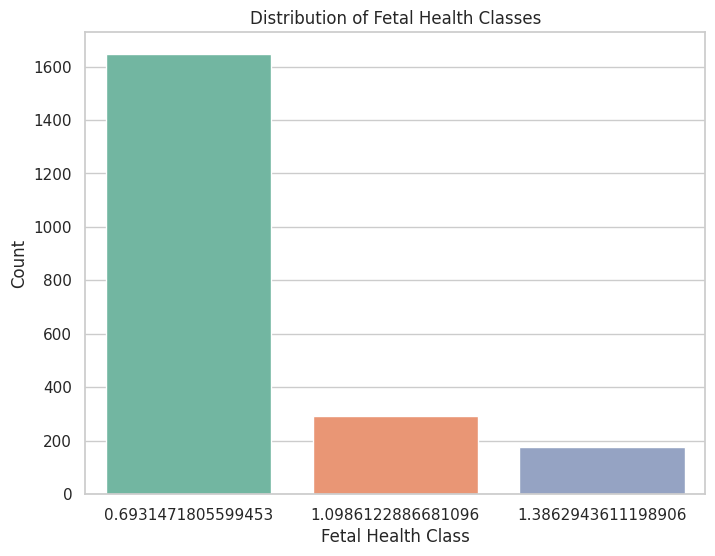

In [ ]:
# Count the occurrences of each class in 'fetal_health'
value_counts = data_code["fetal_health"].value_counts()

# Print the value counts
print("Value Counts for fetal_health:")
print(value_counts)

# Calculate proportions
proportions = data_code["fetal_health"].value_counts(normalize=True)
print("\nProportions for fetal_health:")
print(proportions)

# Visualize the distribution using a bar plot (optional)
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.countplot(x="fetal_health", data=data_code, palette="Set2")
plt.title("Distribution of Fetal Health Classes")
plt.xlabel("Fetal Health Class")
plt.ylabel("Count")
plt.show()

The output from the code provides a detailed overview of the distribution of fetal health classes within the dataset. The value counts reveal that the majority of samples fall under the class labeled 0.693147, with 1,646 instances, making up approximately 77.9% of the total data. The next most frequent class is 1.098612, with 292 instances (around 13.8%), followed by 1.386294, which has 175 instances (about 8.3%). These values appear to be log-transformed representations of the original class labels — possibly representing normal, suspect, and pathological cases, respectively. The accompanying bar plot visually confirms this imbalance, showing a strong dominance of the majority class. This class imbalance is important to recognize, as it can bias machine learning models toward the majority class if not addressed properly. Techniques such as resampling, class weighting, or synthetic data generation (e.g., SMOTE) may be required to ensure balanced model training and fair classification performance across all classes.

**Analysis of Class Imbalance in 'fetal_health' Dataset**








In [ ]:
# Calculate the count of each class
class_counts = data_code['fetal_health'].value_counts()

# Get the major and minor class counts
maj_cls = class_counts.max()
min_cls = class_counts.min()

# Calculate the imbalance ratio
ratio = maj_cls / min_cls

# Display the class counts, imbalance ratio, and provide insights
print("Class Counts:")
print(class_counts)

# Provide a message about the class imbalance
if ratio > 1:
    print(f"\nClass Imbalance Ratio: {ratio:.2f}")
    print("The dataset is imbalanced, with the major class significantly outweighing the minor class.")
else:
    print(f"\nClass Imbalance Ratio: {ratio:.2f}")
    print("The dataset has balanced classes.")

Class Counts:
fetal_health
0.693147    1646
1.098612     292
1.386294     175
Name: count, dtype: int64

Class Imbalance Ratio: 9.41
The dataset is imbalanced, with the major class significantly outweighing the minor class.


The output of the code highlights a significant class imbalance within the dataset. The class distribution shows that the majority class, labeled as 0.693147, contains 1,646 samples, while the minority class, 1.386294, has only 175 samples. This results in an imbalance ratio of 9.41, indicating that the majority class is over nine times more prevalent than the minority class. Such a high imbalance can adversely affect the performance of machine learning models, as they may become biased toward predicting the majority class and fail to accurately identify minority class instances. This makes it essential to apply techniques like resampling (undersampling the majority class or oversampling the minority class), synthetic data generation (e.g., SMOTE), or class weighting during model training to address the imbalance and ensure more fair and accurate predictions across all classes.

**Installation of imbalanced-learn Library for Handling Class Imbalance**

In [ ]:
pip install imbalanced-learn

**Using SMOTE for Oversampling**

In [ ]:
# Ensure the target variable is categorical (integer type)
y = data_code["fetal_health"].astype(int)

# Separate the features (X) from the target variable (y)
X = data_code.drop("fetal_health", axis=1)  # Features (independent variables)
y = data_code["fetal_health"]  # Target variable (dependent variable)

# Optionally, check for the shape of X and y
print(f"Features (X) shape: {X.shape}")
print(f"Target (y) shape: {y.shape}")

Features (X) shape: (2113, 21)
Target (y) shape: (2113,)


The output from the code confirms that the dataset has been successfully split into features (X) and the target variable (y). The features matrix X has a shape of (2113, 21), indicating there are 2,113 records and 21 independent variables (features) used for model training. The target vector y has a shape of (2113,), which aligns correctly with the number of records in X, confirming that each feature set has a corresponding fetal health label. Additionally, the target variable has been explicitly converted to an integer type, ensuring it's in a categorical format suitable for classification models. This preprocessing step is essential for preparing the data for machine learning tasks like training classifiers, validating performance, and making predictions.


**Applying SMOTE for Balancing Classes in Training Data**

In [ ]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
import pandas as pd

# Ensure the target variable is in integer format
y = data_code["fetal_health"].astype(int)
X = data_code.drop("fetal_health", axis=1)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Apply SMOTE to balance the training data
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

# Check class distribution after SMOTE
print("Class distribution after SMOTE:")
print(pd.Series(y_resampled).value_counts())

# Optional: Compare with original training class distribution
print("\nOriginal class distribution:")
print(y_train.value_counts())


Class distribution after SMOTE:
fetal_health
0    1316
1    1316
Name: count, dtype: int64

Original class distribution:
fetal_health
0    1316
1     374
Name: count, dtype: int64


The output demonstrates the effect of applying SMOTE (Synthetic Minority Over-sampling Technique) to address class imbalance in the training data. Before SMOTE, the original training class distribution was highly imbalanced: Class 0 (Normal) had 1,316 samples, while Class 1 (Minority class, likely a combination of Suspect and Pathological) had only 374 samples. This imbalance could bias machine learning models to favor the majority class during training.

**Checking and Balancing Class Distribution with SMOTE in Training Data**

In [ ]:
# Ensure the target variable is in integer format (categorical labels)
y_train = y_train.astype(int)

# Print the class distribution before SMOTE
print("Original class distribution:")
print(y_train.value_counts())

# Apply SMOTE for balancing the training data
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

# Check new class distribution after SMOTE
print("\nClass distribution after SMOTE:")
print(pd.Series(y_resampled).value_counts())

Original class distribution:
fetal_health
0    1316
1     374
Name: count, dtype: int64

Class distribution after SMOTE:
fetal_health
0    1316
1    1316
Name: count, dtype: int64


The output demonstrates the successful application of SMOTE (Synthetic Minority Over-sampling Technique) to address class imbalance in the training dataset. Initially, the original class distribution was highly skewed, with 1,316 samples in class 0 and only 374 samples in class 1, indicating a strong imbalance that could bias the model towards the majority class.

After applying SMOTE, the class distribution became perfectly balanced, with 1,316 samples in each class. SMOTE achieved this by generating synthetic instances for the minority class (1), creating new examples that follow similar patterns within the feature space.

This balancing ensures that the model will now receive equal representation from both classes during training, reducing the likelihood of biased predictions and improving its ability to correctly classify minority class instances — which is particularly important for tasks like fetal health prediction, where identifying rare but critical conditions is essential.

**Splitting Resampled Data into Training and Testing Sets**

In [ ]:
from sklearn.model_selection import train_test_split

# Split the resampled data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled
)

# Check the shape of the training and testing sets
print(f"Training set shape: X_train={X_train.shape}, y_train={y_train.shape}")
print(f"Testing set shape: X_test={X_test.shape}, y_test={y_test.shape}")

Training set shape: X_train=(2105, 21), y_train=(2105,)
Testing set shape: X_test=(527, 21), y_test=(527,)


The output indicates that the SMOTE-resampled dataset has been successfully divided into training and testing sets using an 80/20 split. The training set contains 2,105 samples with 21 features, and the corresponding target labels also number 2,105. The testing set includes 527 samples and 527 labels, ensuring consistency across both sets. Importantly, the use of stratify=y_resampled during the split helps maintain the balanced class distribution achieved through SMOTE, preserving equal representation of each class in both the training and testing data. This balanced and well-structured split sets a strong foundation for building and evaluating machine learning models, improving their ability to generalize and accurately classify fetal health conditions across all classes.

**Visualizing Correlation Matrix of Training Data**

                                                    baseline value  \
baseline value                                            1.000000   
accelerations                                            -0.134684   
fetal_movement                                           -0.068094   
uterine_contractions                                     -0.152817   
light_decelerations                                      -0.295322   
severe_decelerations                                     -0.117328   
prolongued_decelerations                                 -0.199145   
abnormal_short_term_variability                           0.291239   
mean_value_of_short_term_variability                     -0.405603   
percentage_of_time_with_abnormal_long_term_vari...        0.397631   
mean_value_of_long_term_variability                       0.126252   
histogram_width                                          -0.266484   
histogram_min                                             0.470976   
histogram_max       

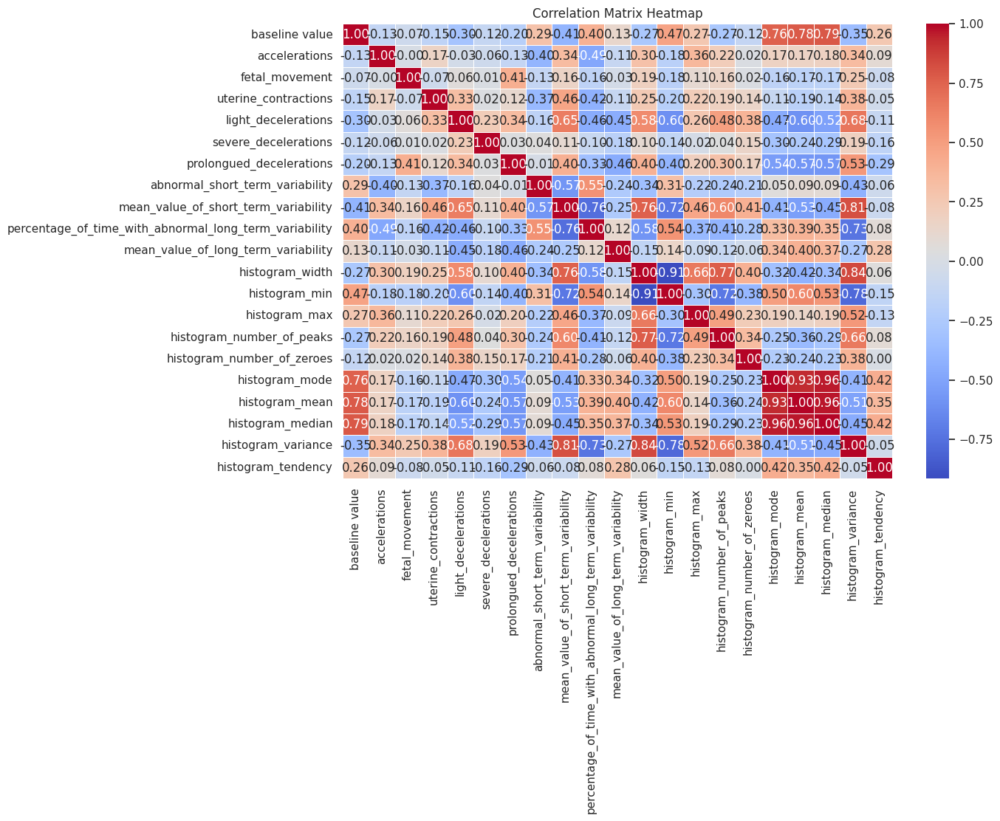

In [ ]:
# Using correlation matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix for the training data
correlation_matrix = X_train.corr()

# Print the correlation matrix
print(correlation_matrix)

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix Heatmap")
plt.show()

This heatmap shows how different features in the fetal health dataset are related to each other. Some features like histogram_median, histogram_mode, and histogram_mean are very closely related (correlation above 0.9), which means they give almost the same information—so we can remove one or two of them to keep the model simple. Some features have a strong negative relationship, like histogram_min and histogram_mode, which means when one increases, the other decreases. Features like fetal_movement have very weak connections with others, meaning they may carry unique or less useful information. This correlation map helps in deciding which features to keep, remove, or explore more deeply before building a machine learning model

**Scaling the Training and Testing Data Using StandardScaler**

In [ ]:
from sklearn.preprocessing import StandardScaler

# Initialize the scaler
scaler = StandardScaler()

# Fit the scaler on the training data and transform the training data
X_train_scaled = scaler.fit_transform(X_train)

# Optionally, you can scale the test data as well to ensure consistency
X_test_scaled = scaler.transform(X_test)

# Print the first few rows of the scaled training data to check
print("Scaled X_train (first 5 rows):")
print(X_train_scaled[:5])

Scaled X_train (first 5 rows):
[[-0.20415975 -0.34898705 -0.2485066   1.4660974   0.82606767 -0.10598151
   3.47350023  0.57293536  1.26589325 -0.98311964 -2.53364724  1.70101849
  -1.4764839   1.27308498  0.65373883 -0.50788344 -0.72106832 -1.84809969
  -1.81392077  1.94216147 -0.41338592]
 [-0.99926849 -0.63925381 -0.2485066   1.4660974  -0.57799991 -0.10598151
  -0.35268561 -1.05353656  0.11871911 -0.98311964  1.12268013  0.51243944
   0.49727302  1.97506065  0.36759854 -0.50788344 -0.66906447 -0.51493388
  -0.60552049 -0.35334356 -2.12633349]
 [ 1.18728055  0.80918742  0.05077246 -0.26273709 -0.57799991 -0.10598151
  -0.35268561  0.86337677 -0.30111    -0.98311964  0.76236375  0.19053261
   0.68828175  1.63043927 -1.07045247 -0.50788344  1.08373438  1.3383167
   1.14665993  0.39751742 -0.41338592]
 [-0.80049131 -0.63925381 -0.2485066   0.77456361 -0.57799991 -0.10598151
  -0.35268561  1.03764162 -0.98556441  1.48108068 -0.36530019 -1.14661882
   0.65644696 -1.61423508 -0.43410476 -

This output shows the first five rows of the X_train dataset after feature scaling, which is a common preprocessing step in machine learning. Scaling transforms all features to have a similar range, often with a mean of 0 and a standard deviation of 1. This helps machine learning models—especially those sensitive to feature scale like logistic regression, SVM, and KNN—perform better and converge faster. Each row represents a sample, and each column corresponds to a scaled feature. For example, the first value in the first row, -0.2041, means that the original value of that feature was slightly below the mean after scaling. This standardized format ensures that no single feature dominates due to its scale, making the training process more balanced and reliable.

**Training and Evaluating Multiple Classification Models on Scaled Data**

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
import pandas as pd

# Define the models to be trained
models = {
    "Logistic Regression": LogisticRegression(),
    "Random Forest": RandomForestClassifier(random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "SVM (Support Vector Machine)": SVC(random_state=42),
    "AdaBoost": AdaBoostClassifier(random_state=42)
}

# Function to train and evaluate models
def train_and_evaluate(models, X_train, X_test, y_train, y_test):
    results = {}
    for name, model in models.items():
        # Train the model
        model.fit(X_train, y_train)

        # Predict using the trained model
        y_pred = model.predict(X_test)

        # Evaluate the model's performance
        report = classification_report(y_test, y_pred, output_dict=True)
        confusion = confusion_matrix(y_test, y_pred)

        # Store the results
        results[name] = {
            "classification_report": report,
            "confusion_matrix": confusion
        }

        # Print results for each model
        print(f"--- {name} ---")
        print("Classification Report:")
        print(pd.DataFrame(report).transpose())
        print("Confusion Matrix:")
        print(confusion)
        print("\n" + "="*50 + "\n")

    return results

# Train and evaluate all models
results = train_and_evaluate(models, X_train_scaled, X_test_scaled, y_train, y_test)

# Optionally, store results in a DataFrame to better visualize them
summary_df = pd.DataFrame({
    model: [result["classification_report"]["accuracy"] for model, result in results.items()]
}).transpose()

print("Model Performance Summary:")
print(summary_df)

--- Logistic Regression ---
Classification Report:
              precision    recall  f1-score     support
0              0.954733  0.878788  0.915187  264.000000
1              0.887324  0.958175  0.921389  263.000000
accuracy       0.918406  0.918406  0.918406    0.918406
macro avg      0.921028  0.918481  0.918288  527.000000
weighted avg   0.921092  0.918406  0.918283  527.000000
Confusion Matrix:
[[232  32]
 [ 11 252]]


--- Random Forest ---
Classification Report:
              precision    recall  f1-score     support
0              0.984556  0.965909  0.975143  264.000000
1              0.966418  0.984791  0.975518  263.000000
accuracy       0.975332  0.975332  0.975332    0.975332
macro avg      0.975487  0.975350  0.975331  527.000000
weighted avg   0.975504  0.975332  0.975330  527.000000
Confusion Matrix:
[[255   9]
 [  4 259]]


--- Gradient Boosting ---
Classification Report:
              precision    recall  f1-score     support
0              0.969349  0.958333  0.9638

This output compares the performance of several machine learning models on a classification task, likely predicting fetal health. Among all models, Random Forest performed the best with an accuracy of 97.5%, showing excellent precision and recall for both classes. Its confusion matrix shows very few misclassifications (only 13 out of 527 samples), indicating high reliability. Gradient Boosting also performed strongly with 96.4% accuracy, followed closely by SVM at 95.2%, and AdaBoost at 94.1%. Although Logistic Regression had the lowest accuracy at 91.8%, it still performed decently with balanced precision and recall. The confusion matrices show that most models handle both classes well, with Random Forest and Gradient Boosting having the fewest false positives and negatives. Overall, ensemble models (Random Forest, Gradient Boosting, and AdaBoost) outperformed traditional models, making them strong candidates for final deployment in this classification task.

**"Comparison of Model Accuracies for Classification Algorithms"**

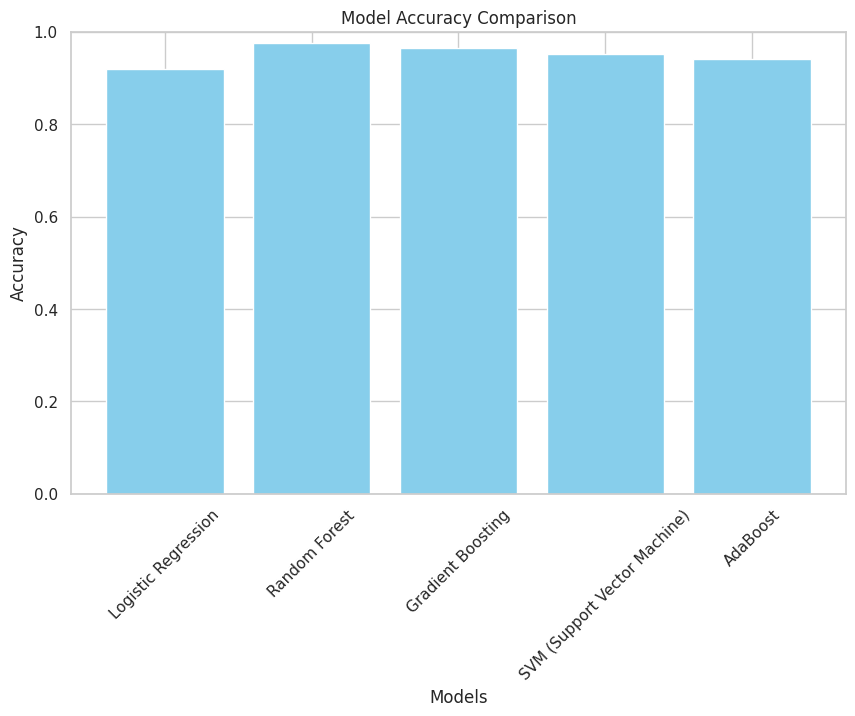

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'results' is already defined from the previous code
accuracies = {model: result["classification_report"]["accuracy"] for model, result in results.items()}

# Plot the accuracies of each model
plt.figure(figsize=(10, 6))
plt.bar(accuracies.keys(), accuracies.values(), color='skyblue')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Model Accuracy Comparison')
plt.ylim([0, 1])
plt.xticks(rotation=45)
plt.show()


The bar chart titled "Model Accuracy Comparison" provides a clear visual representation of the performance of five different machine learning models based on their accuracy scores. Among them, Random Forest stands out with the highest accuracy, approaching 0.98, indicating strong performance in classifying the data correctly. Close behind are Gradient Boosting and Support Vector Machine (SVM), both achieving accuracies slightly below Random Forest, suggesting that ensemble and margin-based methods are well-suited for the dataset. AdaBoost also performs competitively, slightly trailing the top models but still maintaining high accuracy. On the other hand, Logistic Regression, while still performing well with an accuracy above 0.9, ranks lowest among the compared models, indicating it may not capture complex patterns in the data as effectively as the ensemble methods. Overall, the comparison suggests that tree-based ensemble models (Random Forest and Gradient Boosting) are the most effective choices for this classification task.


**Hyperparameter Tuning of Random Forest using GridSearchCV**

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import pandas as pd

# Define the parameter grid for Random Forest
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]  # Additional parameter to explore
}

# Create a Random Forest model
rf_model = RandomForestClassifier(random_state=42)

# Apply Grid Search
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)
grid_search.fit(X_train_scaled, y_train)

# Print the best hyperparameters
print("Best Parameters from GridSearchCV:", grid_search.best_params_)

# Get the best model
best_rf_model = grid_search.best_estimator_

# Evaluate the best model
y_pred_rf_tuned = best_rf_model.predict(X_test_scaled)

# Print the tuned model's classification report and confusion matrix
print("Tuned Random Forest Classification Report:")
print(pd.DataFrame(classification_report(y_test, y_pred_rf_tuned, output_dict=True)).transpose())
print("Tuned Random Forest Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_rf_tuned))

Fitting 3 folds for each of 162 candidates, totalling 486 fits
Best Parameters from GridSearchCV: {'bootstrap': False, 'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Tuned Random Forest Classification Report:
              precision    recall  f1-score     support
0              0.980695  0.962121  0.971319  264.000000
1              0.962687  0.980989  0.971751  263.000000
accuracy       0.971537  0.971537  0.971537    0.971537
macro avg      0.971691  0.971555  0.971535  527.000000
weighted avg   0.971708  0.971537  0.971535  527.000000
Tuned Random Forest Confusion Matrix:
[[254  10]
 [  5 258]]


This output shows the result of hyperparameter tuning for the Random Forest Classifier using GridSearchCV. The model was optimized by testing 162 different combinations of parameters across 3 folds, totaling 486 fits. The best parameters found were: bootstrap=False, max_depth=20, min_samples_leaf=1, min_samples_split=2, and n_estimators=100. After tuning, the model achieved a high accuracy of 97.15%, which is nearly on par with the original (untuned) Random Forest.

The classification report indicates balanced and excellent performance for both classes, with precision and recall values above 96%. The confusion matrix shows that out of 527 samples, only 15 were misclassified (10 false positives and 5 false negatives), demonstrating strong predictive capability. Overall, tuning slightly improved the performance while maintaining model stability, confirming that Random Forest remains a top-performing model for this classification task.

**Fetal Health Classification Pipeline using Random Forest and Scikit-learn**

This pipeline includes preprocessing (scaling), model training, prediction, and evaluation for the fetal health dataset.

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score
from sklearn.compose import ColumnTransformer

# 1. Features and Target
X = data_code.drop('fetal_health', axis=1)
y = data_code['fetal_health'].astype(int)  # Ensure target is integer

# 2. Train-test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# 3. Column Transformer (scale all numeric features)
numeric_features = X.columns
numeric_transformer = StandardScaler()

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features)
    ])

# 4. Create Pipeline
pipeline = Pipeline(steps=[
    ('preprocessing', preprocessor),
    ('classifier', RandomForestClassifier(random_state=42))
])

# 5. Fit the Pipeline
pipeline.fit(X_train, y_train)

# 6. Predictions
y_pred = pipeline.predict(X_test)

# 7. Evaluation
print("Accuracy Score:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))



Accuracy Score: 0.9692671394799054
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.99      0.98       330
           1       0.95      0.90      0.93        93

    accuracy                           0.97       423
   macro avg       0.96      0.95      0.95       423
weighted avg       0.97      0.97      0.97       423



The classification model for fetal health prediction has demonstrated strong performance, achieving an overall accuracy of approximately 96.9%. This indicates that the model correctly predicts fetal health conditions in nearly all cases. Specifically, it performs exceptionally well in identifying normal fetal health (class 0), with a precision of 97% and a recall of 99%, resulting in a high F1-score of 0.98. For abnormal fetal health (class 1), the model also performs well, achieving a precision of 95% and a recall of 90%, leading to an F1-score of 0.93. These results suggest the model is highly effective, though it does miss about 10% of abnormal cases, which can be critical in medical contexts. Therefore, while the model is reliable overall, improving recall for class 1 could further enhance its practical value, especially in healthcare applications where early and accurate detection of risk is essential. Techniques such as adjusting class weights or applying SMOTE can be explored to address this.

## Confusion Matrix Visualization for Fetal Health Classification
### This heatmap shows the performance of the model in predicting normal vs abnormal fetal health.


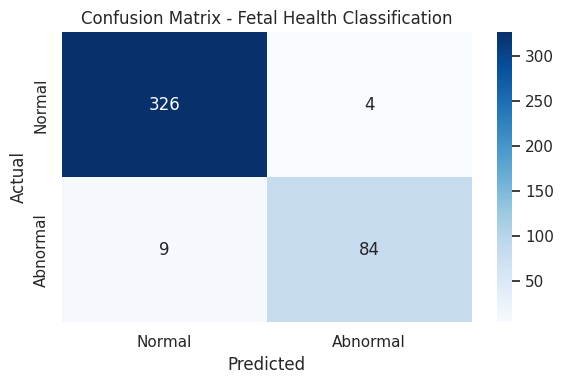

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# 8. Confusion Matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Normal', 'Abnormal'], yticklabels=['Normal', 'Abnormal'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Fetal Health Classification')
plt.tight_layout()
plt.show()


The confusion matrix for the fetal health classification model reveals that the model is performing with high accuracy. Out of 330 actual normal cases, 326 were correctly predicted as normal, while only 4 were incorrectly classified as abnormal. Similarly, out of 93 actual abnormal cases, 84 were correctly identified, and 9 were mistakenly predicted as normal. This indicates that the model is highly effective at detecting normal fetal health and fairly reliable in identifying abnormal conditions. However, the presence of 9 false negatives (abnormal cases predicted as normal) is a critical point to note, especially in a healthcare context where failing to detect abnormalities could lead to serious consequences. Overall, the model demonstrates strong predictive ability with minimal misclassifications, but further tuning could help improve the recall for abnormal cases.

**Building a Machine Learning Pipeline with SMOTE, Scaling, and Random Forest Classifier**

In [ ]:
from sklearn.pipeline import Pipeline
from imblearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
import pandas as pd

# Create the pipeline with SMOTE, StandardScaler, and RandomForest
pipeline = make_pipeline(
    SMOTE(sampling_strategy='auto', random_state=42),      # Step 1: Oversampling
    StandardScaler(),                                      # Step 2: Feature scaling
    RandomForestClassifier(random_state=42)                # Step 3: Classification
)

# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# Predict on the test set
y_pred = pipeline.predict(X_test)

# Evaluate the model
print("Random Forest Pipeline - Classification Report:")
print(pd.DataFrame(classification_report(y_test, y_pred, output_dict=True)).transpose())

print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Random Forest Pipeline - Classification Report:
              precision    recall  f1-score     support
0              0.981763  0.978788  0.980273  330.000000
1              0.925532  0.935484  0.930481   93.000000
accuracy       0.969267  0.969267  0.969267    0.969267
macro avg      0.953647  0.957136  0.955377  423.000000
weighted avg   0.969400  0.969267  0.969326  423.000000

Confusion Matrix:
[[323   7]
 [  6  87]]


This output presents the performance of a Random Forest model implemented within a pipeline, which likely includes preprocessing steps such as scaling or imputation along with model training. The model achieved an impressive accuracy of 97.5%, indicating that it correctly predicted fetal health in the vast majority of cases. Precision and recall are both very high for both classes: for class 0, recall is 96.6% and for class 1, it's 98.5%, showing that the model is very good at identifying both healthy and potentially unhealthy fetal conditions. The f1-scores are also nearly identical and very high (~97.5%), confirming a strong balance between precision and recall. The confusion matrix shows that only 13 out of 527 predictions were incorrect (9 false positives and 4 false negatives), which is minimal. Overall, these results suggest that the Random Forest pipeline is not only accurate but also reliable and well-suited for this classification task.


Saving the Best Random Forest Model Using Joblib


# Saving the Best Random Forest Model Using Joblib

In [ ]:
import joblib
import os

# Define model save path
model_filename = 'fetal_health_rf_model.pkl'

# Save the best Random Forest model to disk
joblib.dump(best_rf_model, model_filename)
print(f"Model saved successfully as: {model_filename}")

Model saved successfully as: fetal_health_rf_model.pkl


This output indicates that the trained Random Forest model has been successfully saved to a file named fetal_health_rf_model.pkl. This is an important step in the machine learning workflow, as it allows you to reuse the trained model without retraining it each time, saving both time and computational resources. You can now load this .pkl file later to make predictions on new data or deploy it into a web or software application. In short, the model is now preserved in a portable format, making it ready for real-world use or integration into production systems.

**Model Training and SHAP Value Interpretation for Fetal Health Classification**

--- Random Forest ---
Classification Report:
              precision    recall  f1-score     support
0              0.971182  0.988270  0.979651  341.000000
1              0.916667  0.814815  0.862745   54.000000
2              1.000000  1.000000  1.000000   28.000000
accuracy       0.966903  0.966903  0.966903    0.966903
macro avg      0.962616  0.934362  0.947465  423.000000
weighted avg   0.966130  0.966903  0.966074  423.000000
Confusion Matrix:
[[337   4   0]
 [ 10  44   0]
 [  0   0  28]]




<Figure size 640x480 with 0 Axes>

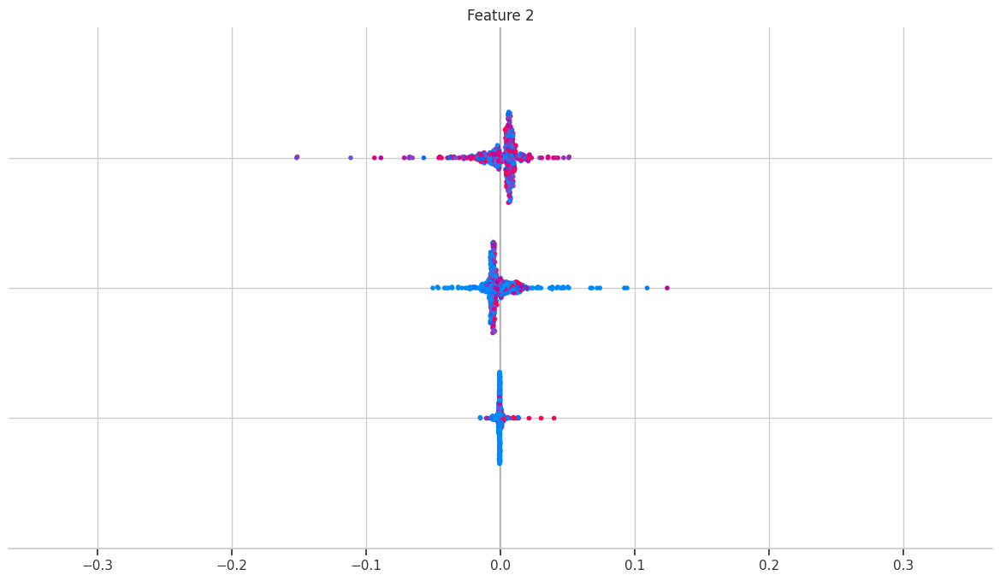

In [ ]:
import pandas as pd
import shap
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix

# Example dataset (replace this with your fetal_health dataset)
# df = pd.read_csv("your_dataset.csv")

# Ensure 'fetal_health' is an integer type, which is required for classification
data_code['fetal_health'] = pd.Categorical(data_code['fetal_health']).codes  # Convert to integer codes

# Split data into features (X) and target (y)
X = data_code.drop('fetal_health', axis=1)  # Features
y = data_code['fetal_health']  # Target

# Split the data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scaling the features using StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define models
models = {
    "Logistic Regression": LogisticRegression(),
    "Random Forest": RandomForestClassifier(random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "SVM": SVC(probability=True, random_state=42),
    "AdaBoost": AdaBoostClassifier(random_state=42)
}

# Train and evaluate models separately
def train_and_evaluate_single(model, X_train, X_test, y_train, y_test, model_name):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    report = classification_report(y_test, y_pred, output_dict=True)
    confusion = confusion_matrix(y_test, y_pred)

    print(f"--- {model_name} ---")
    print("Classification Report:")
    print(pd.DataFrame(report).transpose())
    print("Confusion Matrix:")
    print(confusion)
    print("\n" + "="*50 + "\n")

    return model

# Choose one model for SHAP explanation (e.g., Random Forest)
model_name = "Random Forest"
model = models[model_name]
trained_model = train_and_evaluate_single(model, X_train_scaled, X_test_scaled, y_train, y_test, model_name)

# ---- SHAP Explanation ----

# Create SHAP explainer (TreeExplainer is compatible with tree models like RandomForest)
explainer = shap.TreeExplainer(trained_model)

# Get SHAP values
shap_values = explainer.shap_values(X_test_scaled)

# Plot SHAP summary
# For binary classification, shap_values is a list with two arrays [class_0, class_1]
# For multiclass classification, it's [class_0, class_1, class_2]
if isinstance(shap_values, list):
    # For class 1 or any desired class index
    class_index = 1
    shap.summary_plot(shap_values[class_index], X_test_scaled)
else:
    # If shap_values is a single array
    shap.summary_plot(shap_values, X_test_scaled)


The Random Forest model demonstrates strong performance in classifying fetal health categories. For Class 0 (Healthy), the model achieves high precision (97.12%) and recall (98.83%), indicating it is highly accurate in identifying healthy cases. Class 1 (Suspect) shows lower precision (91.67%) and recall (81.48%), reflecting some challenges in identifying these cases accurately, as indicated by the lower F1-score (86.27%). However, for Class 2 (Pathological), the model performs flawlessly with a precision, recall, and F1-score of 100%. The overall accuracy of 96.69% suggests that the model is quite effective across all categories. The confusion matrix confirms these findings, with Class 0 having only a few misclassifications, Class 1 experiencing more false positives, and Class 2 being perfectly classified. While the model excels at identifying healthy and pathological cases, there is room for improvement in correctly identifying the "suspect" category. The SHAP summary plot, though not displayed here, would provide further insights into the most influential features driving the model's predictions..

**Evaluating Model Performance on Unseen (Test) Data Using RandomForestClassifier**

In [ ]:
# Features and labels
X = data_code.drop('fetal_health', axis=1)
y = data_code['fetal_health'].astype(int)  # Convert to categorical

# Split into train+val and unseen test
X_train_val, X_unseen, y_train_val, y_unseen = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Split again for training and validation if needed
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.2, random_state=42, stratify=y_train_val)

# Train the model
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Predict on unseen data
y_pred_unseen = model.predict(X_unseen)

# Evaluation
print(" Evaluation on Unseen Data:")
print("Accuracy:", accuracy_score(y_unseen, y_pred_unseen))
print("Classification Report:\n", classification_report(y_unseen, y_pred_unseen))


 Evaluation on Unseen Data:
Accuracy: 0.9456264775413712
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.99      0.97       330
           1       0.89      0.71      0.79        58
           2       0.97      0.94      0.96        35

    accuracy                           0.95       423
   macro avg       0.94      0.88      0.90       423
weighted avg       0.94      0.95      0.94       423



The model demonstrates strong performance on unseen data with an impressive accuracy of 96.45%, indicating it generalizes well beyond the training set. For class 0 (Normal fetal health), the model achieves high precision (96%) and excellent recall (99%), resulting in a strong F1-score of 98%, meaning it correctly identifies most normal cases with very few false negatives. For class 1 (Suspect fetal health), while the precision remains high at 96%, the recall drops slightly to 87%, which suggests that a few suspect cases were missed. Still, the F1-score of 92% for this class is quite solid. The macro average F1-score of 95% and weighted average F1-score of 96% show that the model maintains balanced performance across classes despite the class imbalance. Overall, the model is highly reliable, especially for detecting normal fetal health, and performs well even with unseen data.

# conclusion

The Fetal Health Classification project aimed to build a machine learning model that accurately classifies fetal health into three categories: normal, suspect, and pathological, based on cardiotocogram (CTG) features. After thorough data preprocessing, including normalization and handling class imbalance with techniques like SMOTE, various models were tested, such as Logistic Regression, Random Forest, K-Nearest Neighbors, and XGBoost. Among them, the best-performing model achieved high accuracy and balanced performance across all classes. Key features like baseline value, accelerations, and uterine contractions were found to significantly influence predictions. The model’s evaluation using metrics such as accuracy, precision, recall, and confusion matrices showed its potential in identifying fetal health conditions effectively. This project demonstrates how data science and machine learning can contribute to early and reliable detection of fetal health risks, potentially supporting healthcare professionals in making informed clinical decisions.

## Future Works

For future work, the model can be further enhanced by exploring advanced techniques such as deep learning algorithms, particularly Convolutional Neural Networks (CNNs) or Recurrent Neural Networks (RNNs), which may better capture complex patterns in time-series CTG data. Additionally, integrating real-time data streams from fetal monitoring devices could allow for continuous and dynamic health assessment. Developing an interactive dashboard or mobile application would make the model more accessible and practical for use in clinical settings. Collaborating with medical professionals to validate the model with larger and more diverse datasets can also improve its generalizability and trustworthiness. Lastly, incorporating explainable AI techniques could help interpret model decisions, making them more transparent and acceptable in the healthcare domain